In [4]:
#step5: combine and run through seurat pipeline
#default normalization 
#library
suppressMessages(library(Seurat))
suppressMessages(library(ggplot2))

In [2]:
#12. combine all the rds into one seurat subject 

setwd("/g/data/zk16/qing/tuomas/shDNMT1_scRNA/04QC/")

filename <- list.files(pattern="*qc.rds")
filename

[1] "IGO_028755_noempty_nodoublet_qc.rds" "IGO_028756_noempty_nodoublet_qc.rds"
[3] "IGO_028761_noempty_nodoublet_qc.rds"

In [3]:
#read in rds file for each batch
filelist=list()

for (i in 1:length(filename)){

        filelist[[i]]<-readRDS(filename[[i]])
}


In [4]:
#only keep genes expressed in each batch
for (i in 1:length(filename)){

        #filter genes

        count=GetAssayData(object = filelist[[i]], slot = 'count')

        keep = rowSums(count > 0) > 0

        filelist[[i]]=filelist[[i]][keep,]

        print(filelist[[i]])

}

An object of class Seurat 
28933 features across 8020 samples within 1 assay 
Active assay: RNA (28933 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap
An object of class Seurat 
29668 features across 8040 samples within 1 assay 
Active assay: RNA (29668 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap
An object of class Seurat 
28115 features across 4856 samples within 1 assay 
Active assay: RNA (28115 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap


In [5]:
#merge data
obj <- merge(filelist[[1]], y = c(filelist[[2]], filelist[[3]]), add.cell.ids = c("IGO_028755", "IGO_028756", "IGO_028761"), project = "shDNMT1_scRNA", merge.data = TRUE)



In [6]:
#check meta data

head(obj[[]])

,orig.ident,nCount_RNA,nFeature_RNA,nCount_HTO,nFeature_HTO,hash,Submission.date,Mouse.ID,Hashtag.ID,Hashtag.sequence,...,GFP..other.cells,Cells.for.submission,X10x.submission.ID,X10x.sequencing.data.ID,Hashtag.sequencing.data.ID,Hashtag,percent.mt,percent.ribo,RNA_snn_res.0.5,seurat_clusters
,<chr>,<dbl>,<int>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
IGO_028755_AAACCCAAGACACACG-1,SeuratProject,6873,2509,4676,8,B0306-TotalSeqB,NA,BE1055,HTO-6,TATGCTGCCACGGTA,...,2500,NA,IGO-028755,NA,NA,B0306,2.109705,0.03942965,5,5
IGO_028755_AAACCCAAGCGCATCC-1,SeuratProject,9110,3325,9278,8,B0305-TotalSeqB,NA,BD1662,HTO-5,CTTTGTCTTTGTGAG,...,2500,Used to be BD1314,IGO-028755,NA,NA,B0305,1.800220,0.05257958,9,9
IGO_028755_AAACCCAAGCGCTGAA-1,SeuratProject,5342,2112,307,8,B0307-TotalSeqB,NA,BE1056,HTO-7,GAGTCTGCCAGTATC,...,2500,NA,IGO-028755,NA,NA,B0307,2.976413,0.05409959,4,4
IGO_028755_AAACCCAAGCTGGCCT-1,SeuratProject,7166,2765,290,8,B0307-TotalSeqB,NA,BE1056,HTO-7,GAGTCTGCCAGTATC,...,2500,NA,IGO-028755,NA,NA,B0307,1.911806,0.04967904,5,5
IGO_028755_AAACCCAAGGAGGTTC-1,SeuratProject,7470,3046,5613,8,B0308-TotalSeqB,NA,BE1061,HTO-8,TATAGAACGCCAGGC,...,2500,NA,IGO-028755,NA,NA,B0308,2.423025,0.06880857,2,2
IGO_028755_AAACCCACAGACCAGA-1,SeuratProject,6056,2653,13689,8,B0301-TotalSeqB,7/25/2023,AM1769,HTO-1,ACCCACCAGTAAGAC,...,2500,Number: 21450,IGO-028755,20230725_shDNMT1_IGO_14863_C_1,20230725_shDNMT1_FB_IGO_14863_D_1,B0301,2.608983,0.03418098,0,0


In [7]:
colnames(obj[[]])

[1] "orig.ident"                 "nCount_RNA"                
 [3] "nFeature_RNA"               "nCount_HTO"                
 [5] "nFeature_HTO"               "hash"                      
 [7] "Submission.date"            "Mouse.ID"                  
 [9] "Hashtag.ID"                 "Hashtag.sequence"          
[11] "shRNA.group"                "Age"                       
[13] "Sex"                        "GFP..Epithelial.cells"     
[15] "GFP..other.cells"           "Cells.for.submission"      
[17] "X10x.submission.ID"         "X10x.sequencing.data.ID"   
[19] "Hashtag.sequencing.data.ID" "Hashtag"                   
[21] "percent.mt"                 "percent.ribo"              
[23] "RNA_snn_res.0.5"            "seurat_clusters"

In [10]:
table(obj$shRNA.group, obj$X10x.submission.ID)

           
            IGO-028755 IGO-028756 IGO-028761
  shDNMT1_2       1965       2063       1169
  shDNMT1_3       2022       2057        763
  shRen713        4033       3920       2924

In [12]:
obj$condition=ifelse(obj$shRNA.group %in% c('shDNMT1_2', 'shDNMT1_3'), 'shDNMT1', 'control')
table(obj$condition)


control shDNMT1 
  10877   10039 

In [13]:
#remove outlier samples due to tumor
#IDname=unique(obj$ID)

#IDname=IDname[! IDname %in% c('1105','1106','1107')]

#obj=subset(obj,  ID %in% IDname)


obj$both=paste(obj$Age, obj$condition, sep="_")
table(obj$both)


A_control Y_control Y_shDNMT1 
     5061      5816     10039 

In [6]:
#basic filter
#build new seurat object to Include features detected in at least this many cells. Include cells where at least this many features are detected.
#obj=CreateSeuratObject(counts = GetAssayData(obj, slot='count'), project = 'scRNA_exercise', min.cells = 3, min.features = 200, meta.data = obj[[]]) 
#obj


An object of class Seurat 
27966 features across 37522 samples within 1 assay 
Active assay: RNA (27966 features, 0 variable features)

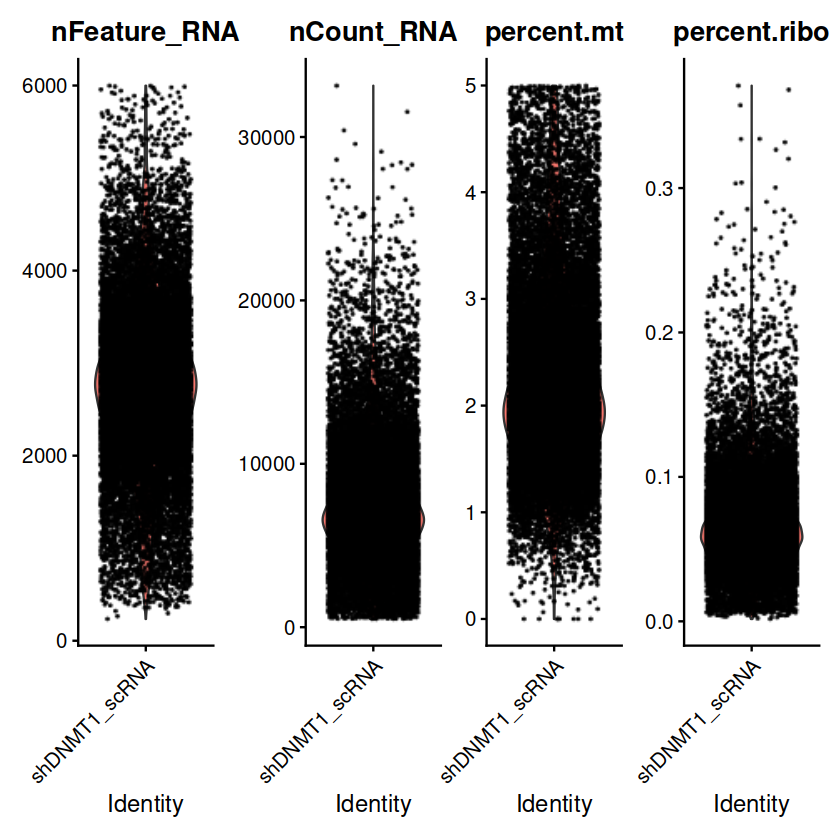

In [14]:
#Standard pre-processing workflow
#QC and selecting cells for further analysis
Idents(obj)='shDNMT1_scRNA'

VlnPlot(obj, features = c("nFeature_RNA", "nCount_RNA", "percent.mt", "percent.ribo"), ncol = 4)


In [15]:
#options(repr.plot.width=12, repr.plot.height=12)
#plot1 <- FeatureScatter(obj, feature1 = "nCount_RNA", feature2 = "percent.mt")
#plot2 <- FeatureScatter(obj, feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
#plot1 + plot2

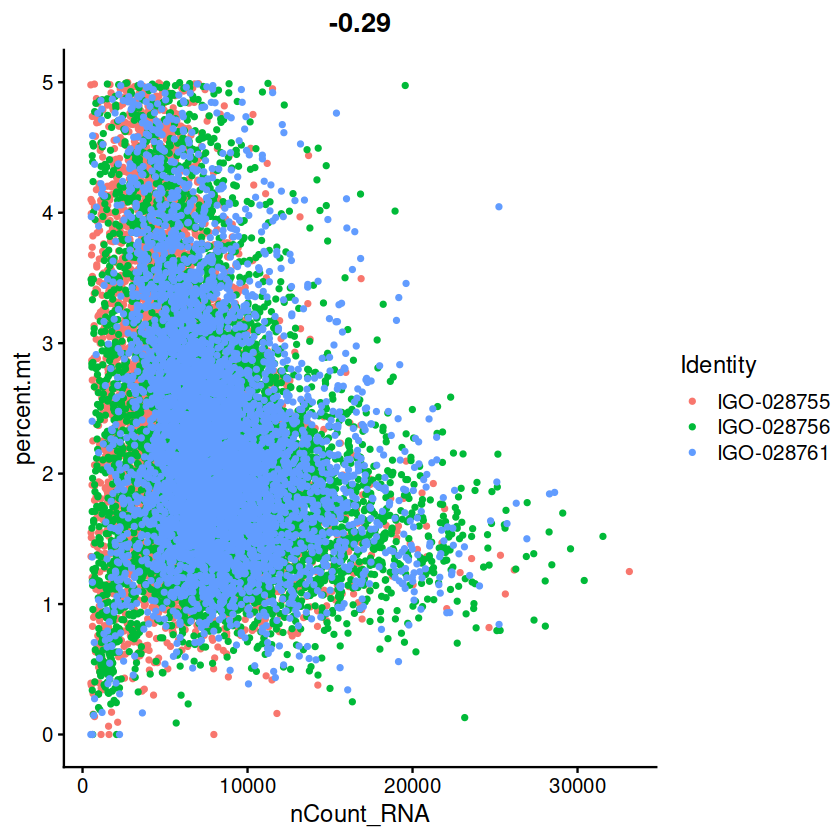

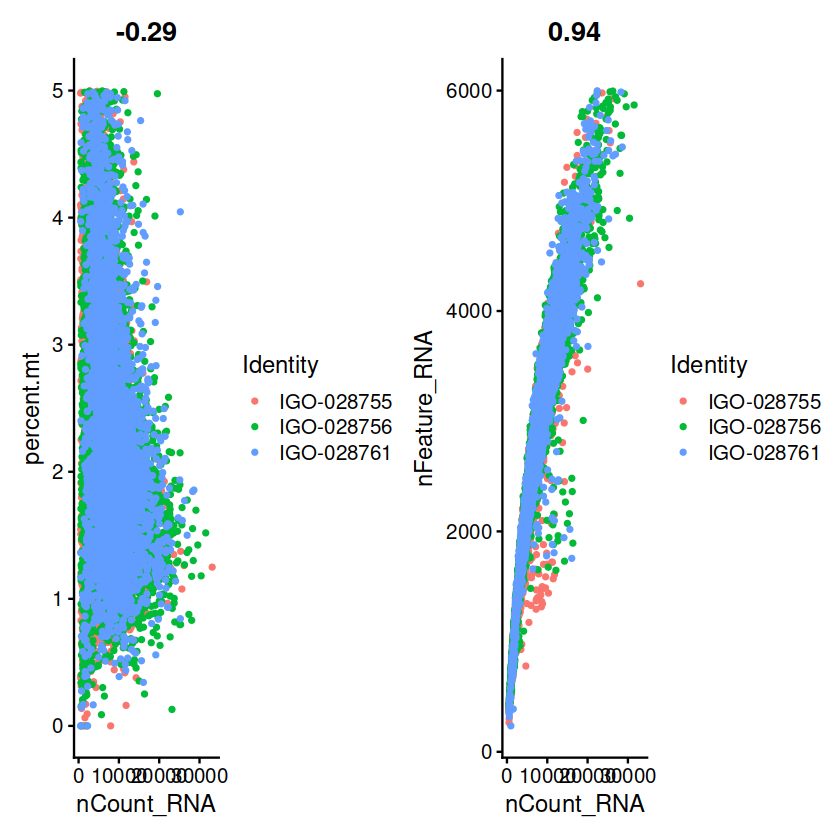

In [16]:
FeatureScatter(obj, feature1 = "nCount_RNA", feature2 = "percent.mt", group.by ='X10x.submission.ID')

plot1 <- FeatureScatter(obj, feature1 = "nCount_RNA", feature2 = "percent.mt", group.by ='X10x.submission.ID')
plot2 <- FeatureScatter(obj, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by ='X10x.submission.ID')
plot1 + plot2

In [17]:
#normalize data
obj <- NormalizeData(obj, normalization.method = "LogNormalize", scale.factor = 10000)

When using repel, set xnudge and ynudge to 0 for optimal results



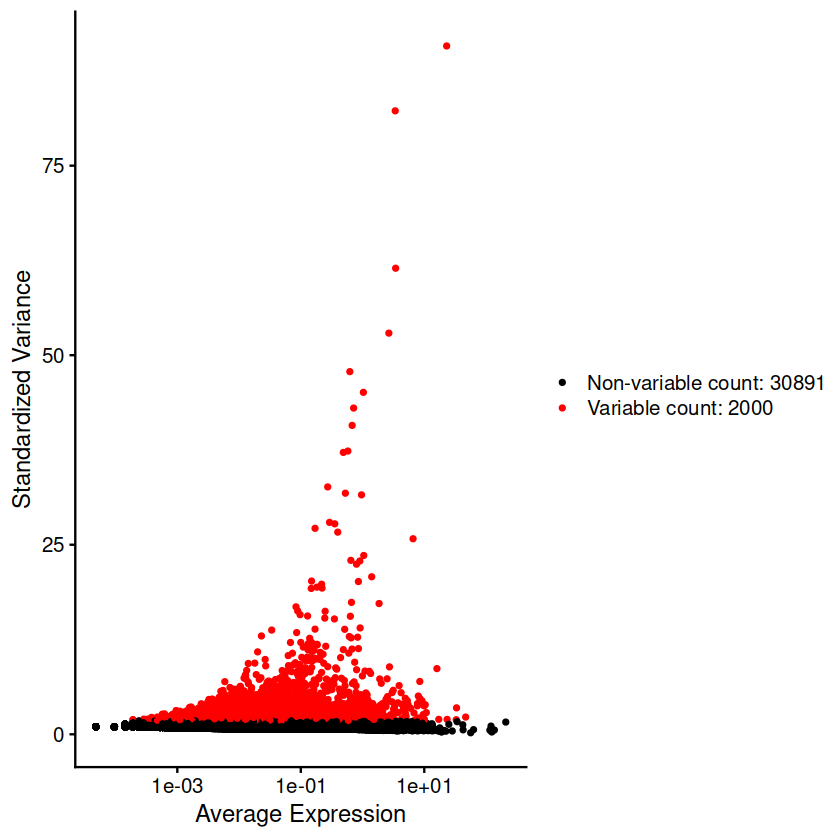

In [18]:
#dimension reduction (seurat pipeline)

#1.Identification of highly variable features (feature selection)
obj <- FindVariableFeatures(obj, selection.method = "vst", nfeatures = 2000)

# Identify the 10 most highly variable genes
top10 <- head(VariableFeatures(obj), 10)

# plot variable features with and without labels
plot1 <- VariableFeaturePlot(obj)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)
plot1 

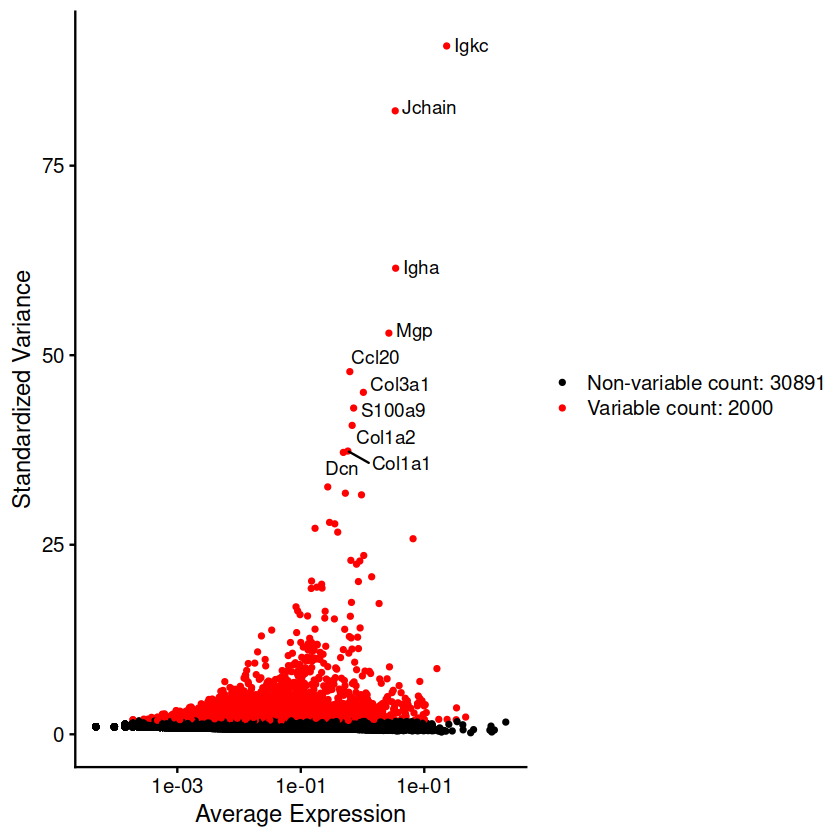

In [19]:
plot2

In [20]:
#2Scaling the data
all.genes <- rownames(obj)
obj <- ScaleData(obj, features = all.genes)

Centering and scaling data matrix



In [21]:
#3 run PCA
obj <- RunPCA(obj, features = VariableFeatures(object = obj))

PC_ 1 
Positive:  Nckap5, Mecom, Ank3, Sftpd, Lamp3, Atp1b1, Phldb2, Sfta3-ps, Pard3, Wfdc2 
	   Ptprf, Slc34a2, Sftpb, Ppp1r14c, Sftpa1, Ptprm, Cldn18, Slc12a2, Chil1, Itga9 
	   Cxcl15, Hc, Lpcat1, Cadm1, Car8, Ccdc141, Napsa, Muc1, Pip5k1b, Scd1 
Negative:  Ctss, Ctsd, Chil3, Slc7a2, Olr1, Lpl, Plet1, Cd52, Spp1, Ctsb 
	   Xylt1, Pparg, Osbpl8, Fn1, Plcb1, Gpnmb, Clec4d, Mmp19, Il1b, Wfdc21 
	   Cxcl2, Abca1, Il1rn, Cd86, Nlrp3, Cd14, Wfdc17, Ctsk, Trem2, Rgs2 
PC_ 2 
Positive:  Col3a1, Serping1, Bgn, Col1a2, Col1a1, Mfap4, Mgp, Fbn1, Eln, Col5a2 
	   Lama2, Dpt, Loxl1, Ltbp4, Mfap5, Rarres2, Ogn, Sparcl1, Zfpm2, Pcolce2 
	   Ptprd, Sod3, Rbp1, Abi3bp, Col6a3, Cdh11, Pdgfra, Cfh, Cacna2d1, Gpc3 
Negative:  Slc34a2, Lamp3, Napsa, Ank3, Sftpb, Hc, Chil1, Cxcl15, Atp8a1, Sftpa1 
	   Scd1, Ppp1r14c, Wfdc2, Sftpd, Alcam, Atp1b1, Abca3, Lpcat1, Sfta2, Car8 
	   Muc1, Cbr2, Sfta3-ps, Egfl6, Cd74, Fasn, Pip5k1b, S100g, Etv5, Ptprf 
PC_ 3 
Positive:  Col3a1, Col1a2, Col1a1, Mfap5, Lama2, Ser

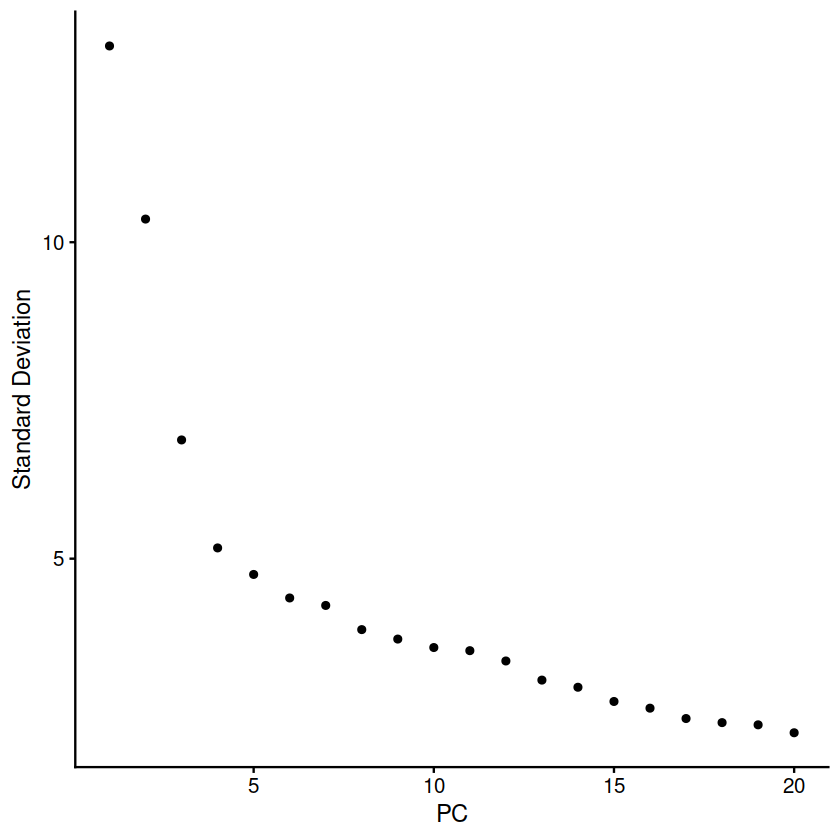

In [22]:
#4 decide how many dims to use
ElbowPlot(obj)


In [23]:
#5. cluster cells
obj <- FindNeighbors(obj, dims = 1:10)
obj <- FindClusters(obj, resolution = 0.5)


Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 20916
Number of edges: 664883

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9113
Number of communities: 14
Elapsed time: 2 seconds


In [24]:
#6. Run non-linear dimensional reduction (UMAP/tSNE)
obj <- RunUMAP(obj, dims = 1:10, verbose = F)


Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


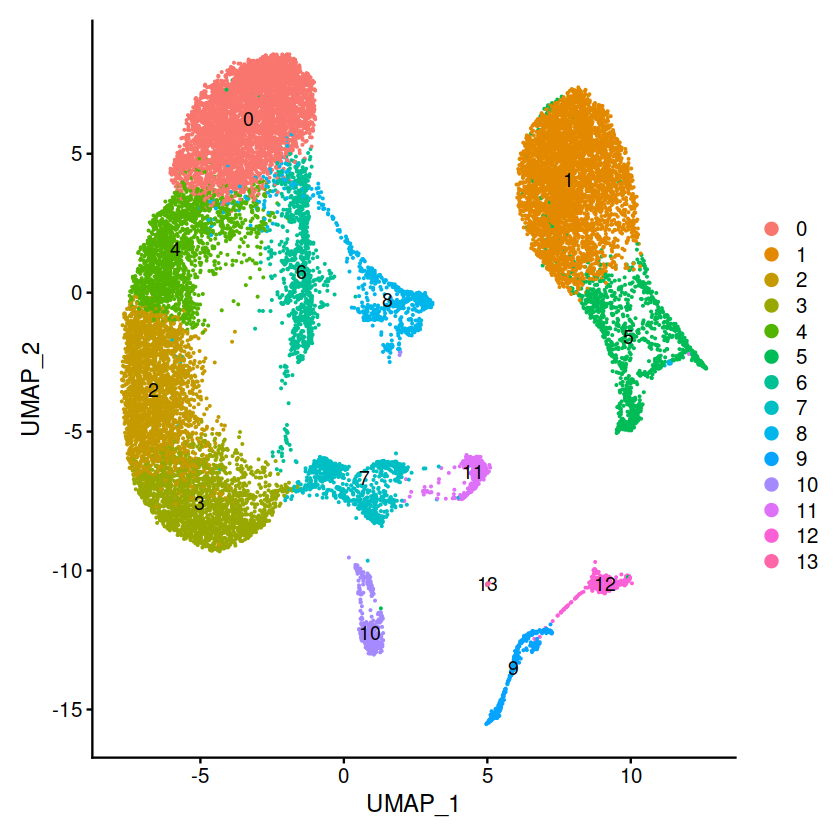

In [25]:
p1=DimPlot(obj, reduction = "umap", label = T)
p1


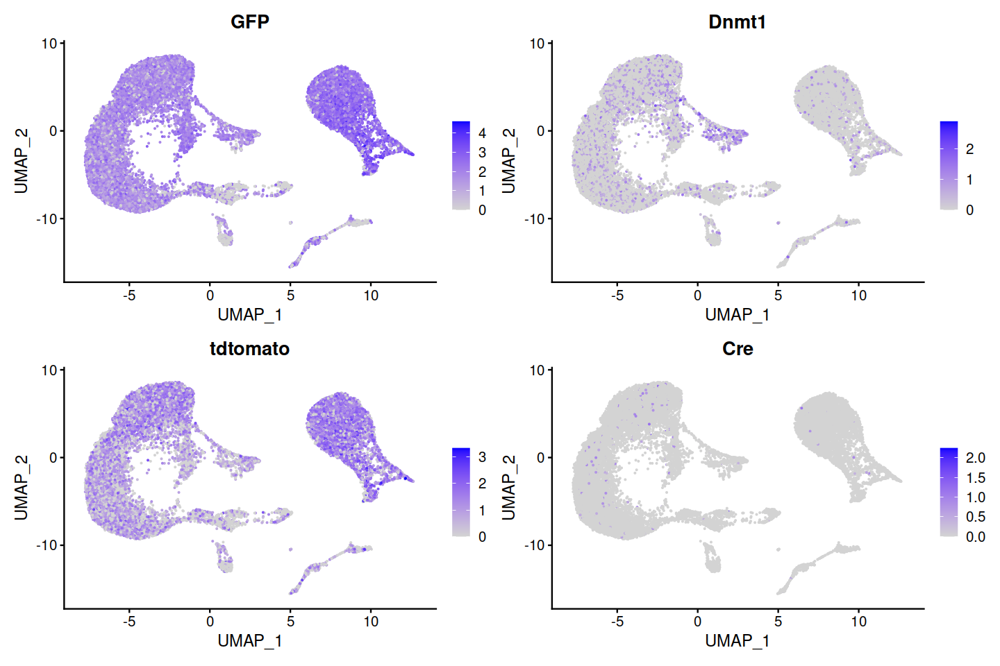

In [46]:
#sanity check on GFP
options(repr.plot.width=12, repr.plot.height=8)
FeaturePlot(obj, reduction = "umap", features =c('GFP','Dnmt1', 'tdtomato', 'Cre'))

In [45]:
head(rownames(obj
             ))

[1] "Xkr4"    "Gm19938" "Gm37381" "Rp1"     "Sox17"   "Gm37587"

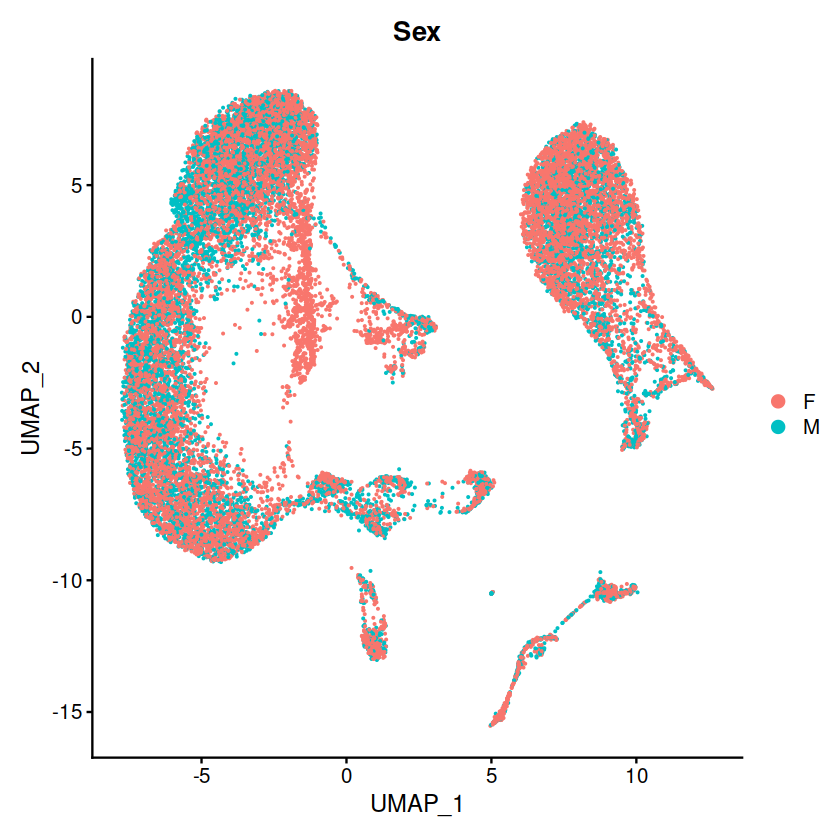

In [26]:
p2=DimPlot(obj, reduction = "umap", group.by = 'Sex')
p2

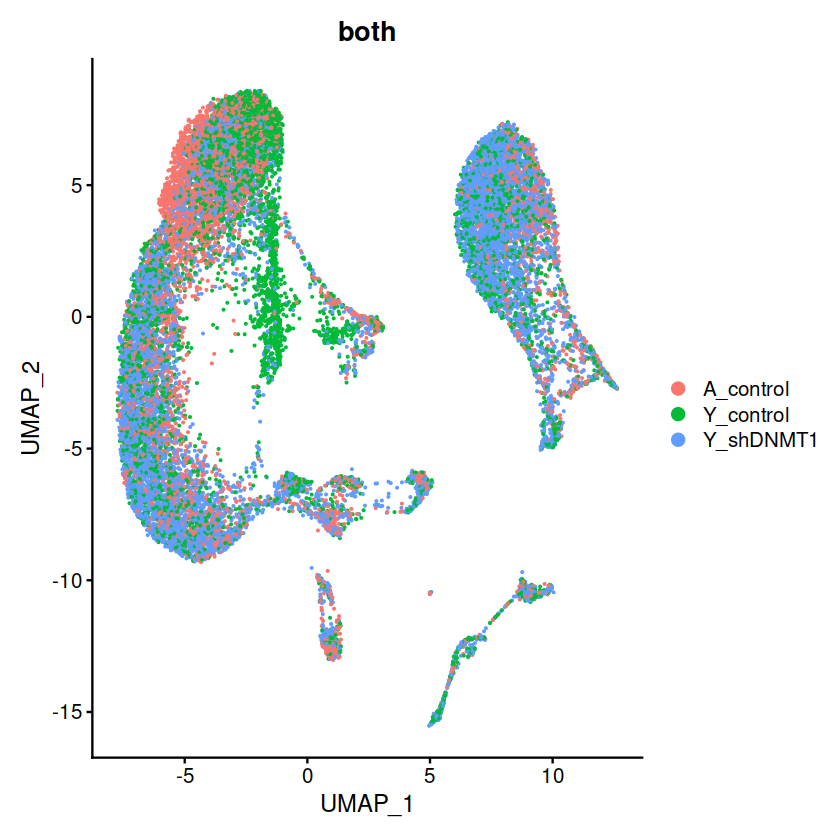

In [27]:
p3=DimPlot(obj, reduction = "umap", group.by = 'both')
p3

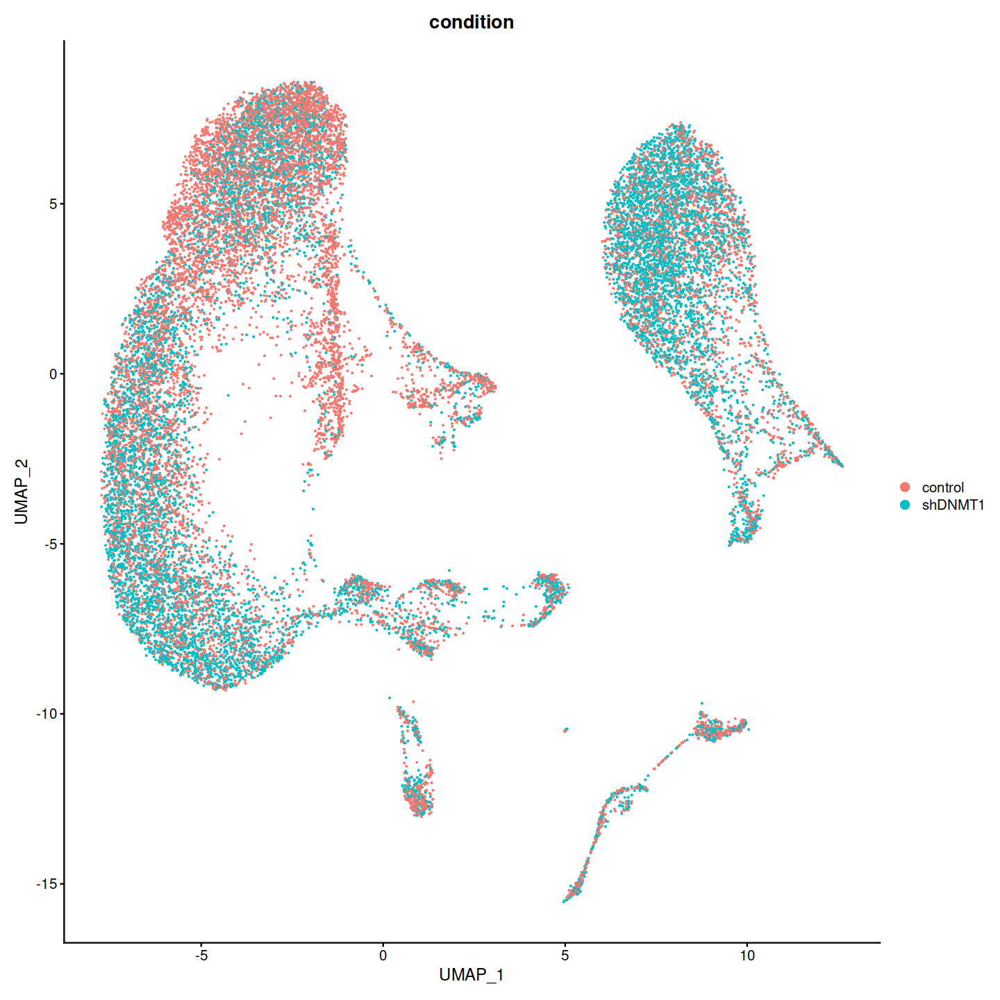

In [38]:
DimPlot(obj, reduction = "umap", group.by = 'condition')

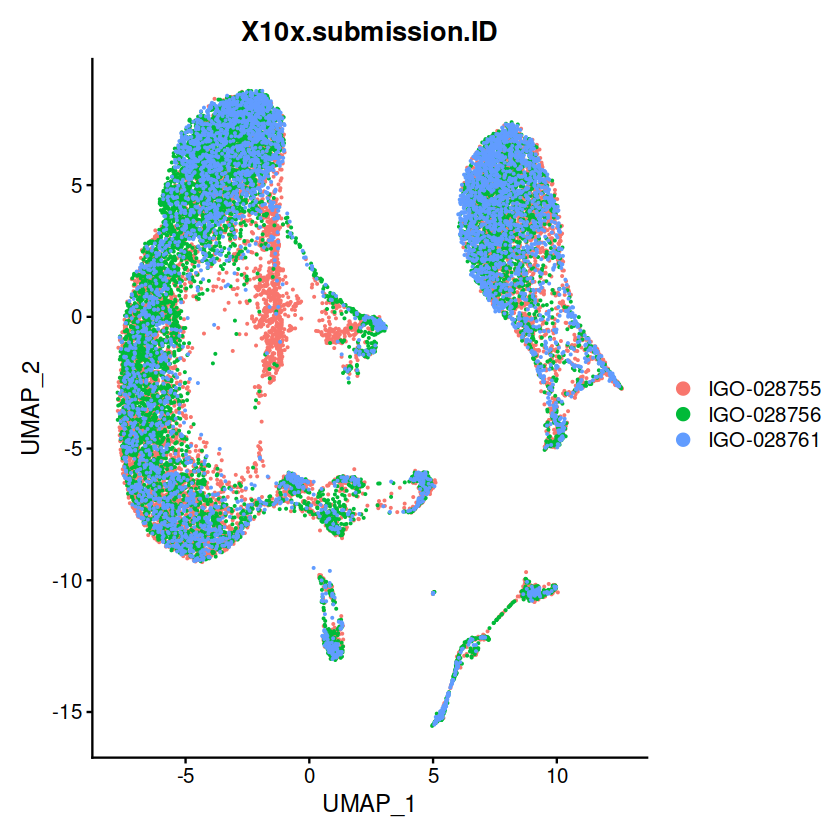

In [28]:
p4=DimPlot(obj, reduction = "umap", group.by = 'X10x.submission.ID')
p4

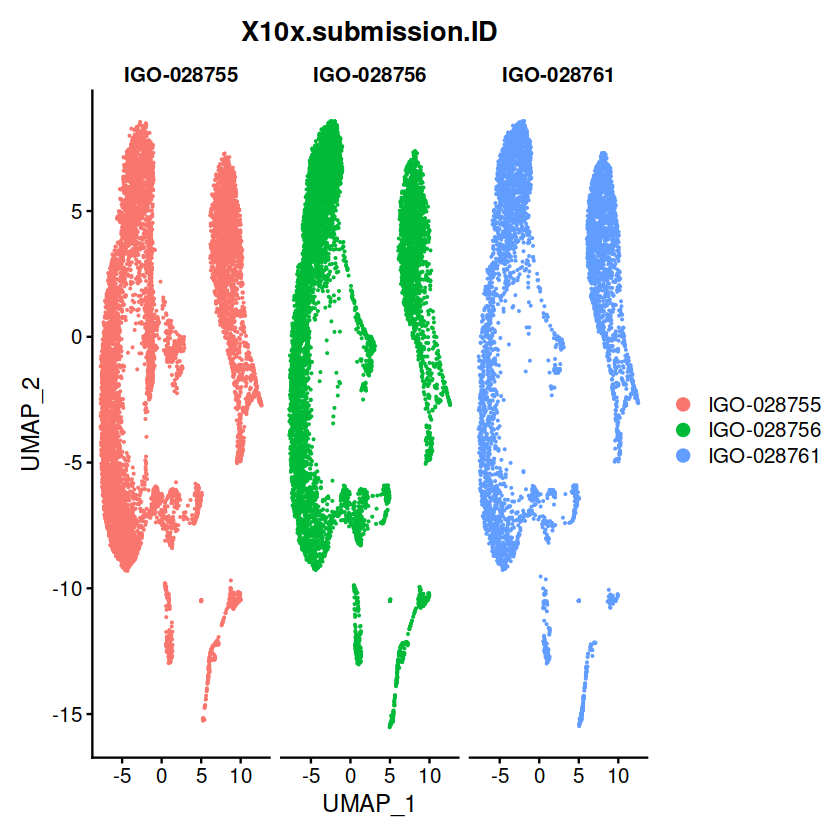

In [29]:
DimPlot(obj, reduction = "umap", group.by = 'X10x.submission.ID', split.by='X10x.submission.ID')

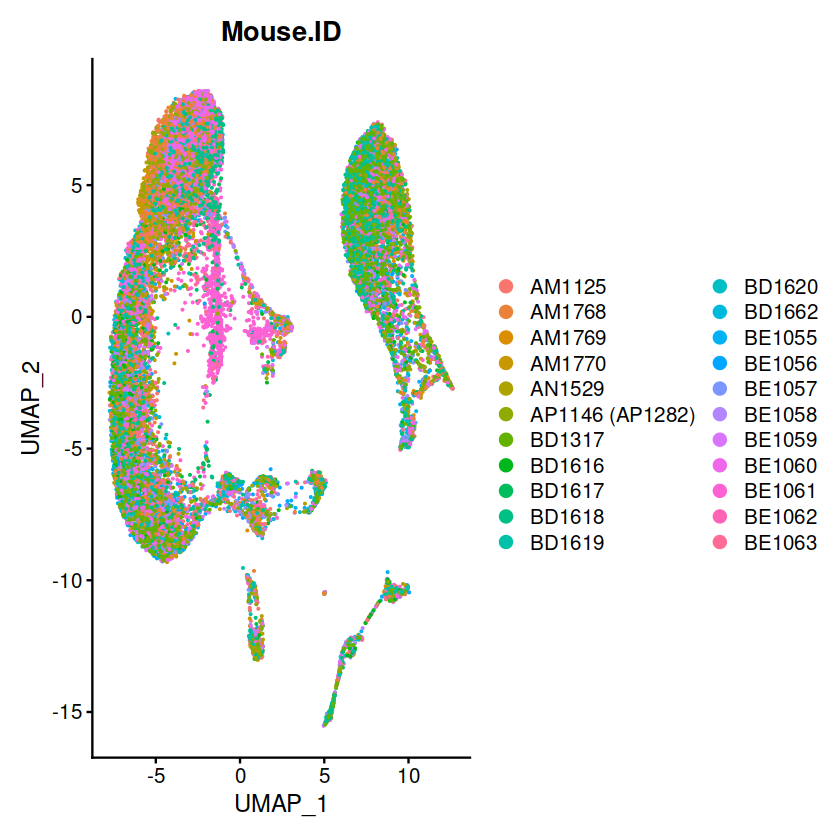

In [30]:
p5=DimPlot(obj, reduction = "umap", group.by = 'Mouse.ID')
p5

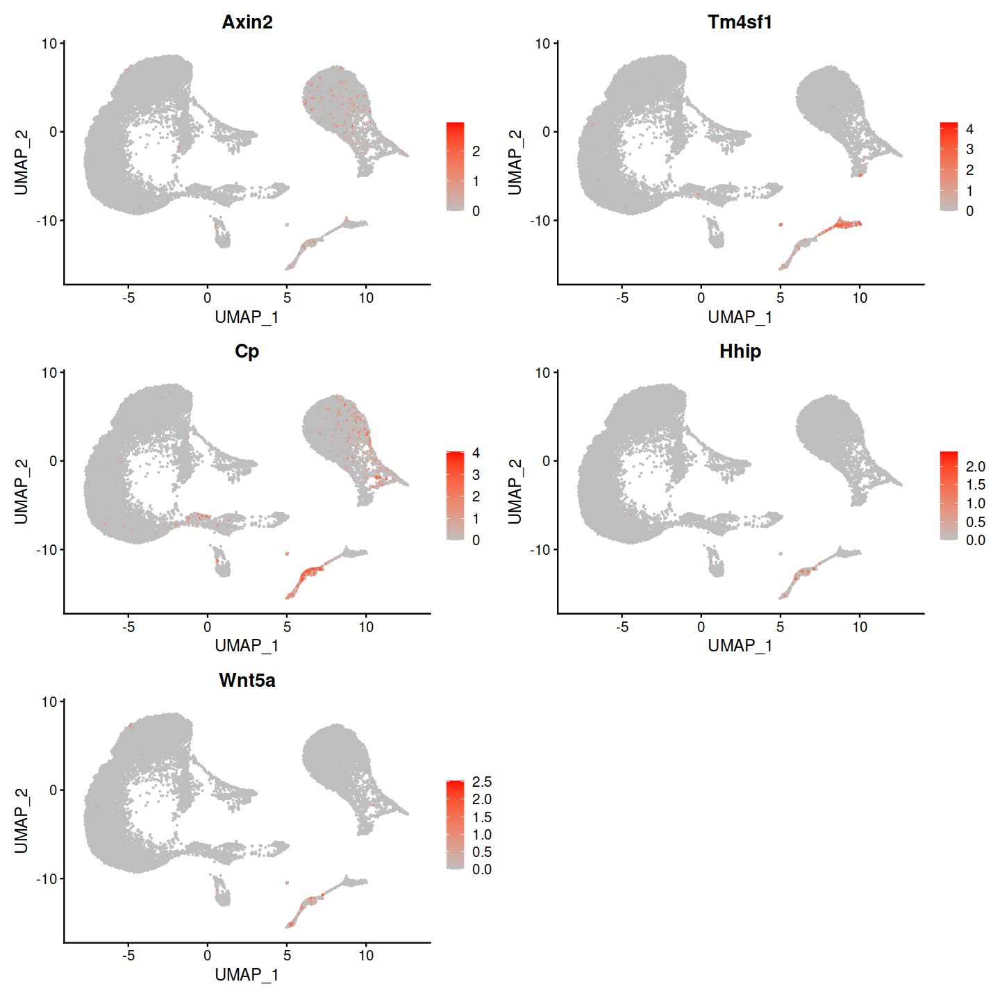

In [31]:
#AT2S marker
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction = "umap", features = c('Axin2', 'Tm4sf1', 'Cp', 'Hhip', 'Wnt5a'),  ncol =2, cols = c("grey", "red"))

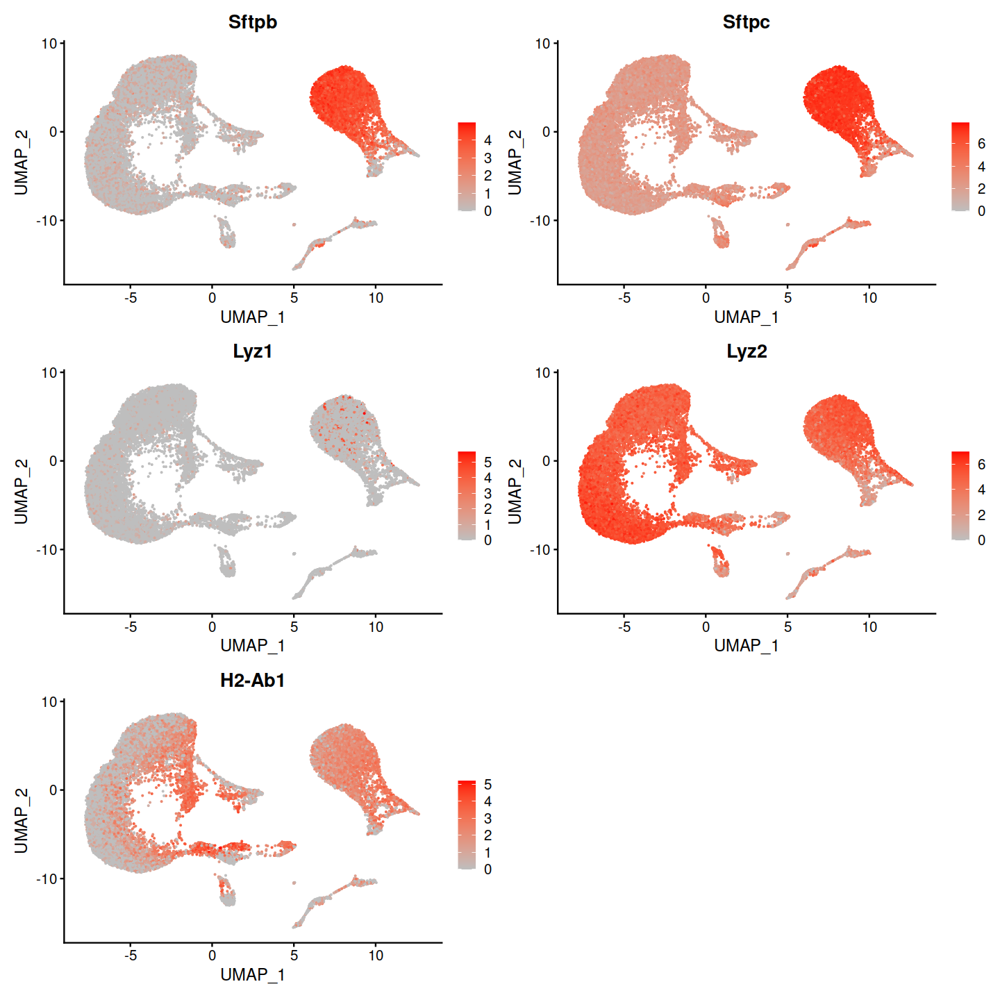

In [32]:
#AT2 marker
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction = "umap", features = c('Sftpb', 'Sftpc', 'Lyz1', 'Lyz2', 'H2-Ab1'),  ncol =2, cols = c("grey", "red"))

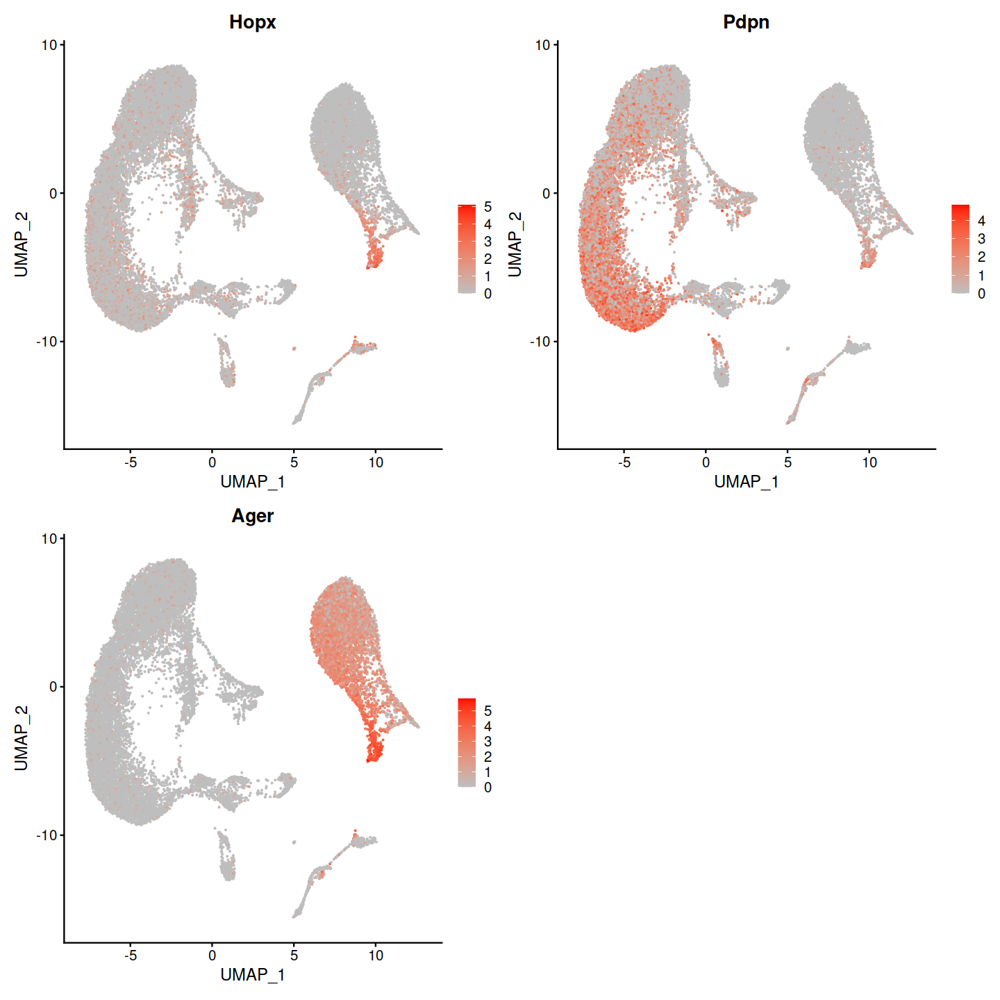

In [33]:
#AT1 marker
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction = "umap", features = c('Hopx', 'Pdpn', 'Ager'),  ncol =2, cols = c("grey", "red"))

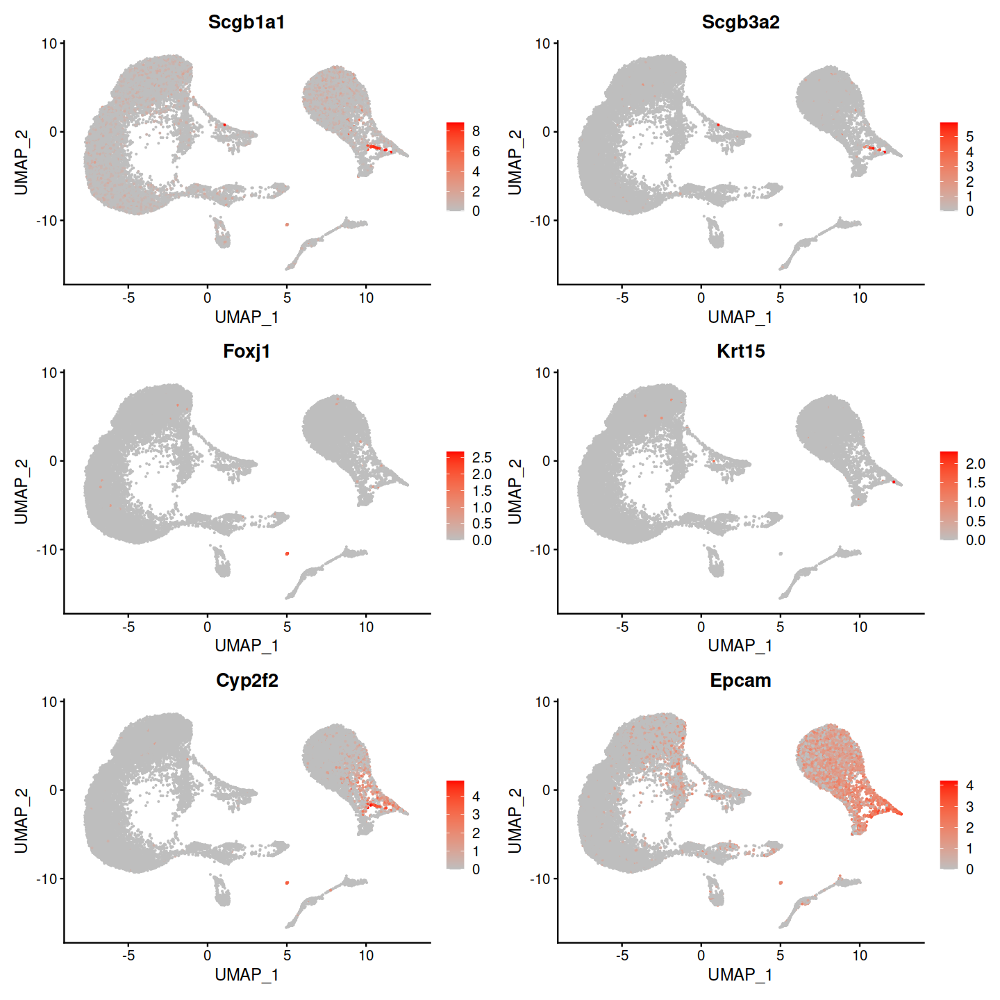

In [34]:
#bronchiolar_epithelial_marker
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction = "umap", features = c('Scgb1a1', 'Scgb3a2', 'Foxj1', "Krt15", "Cyp2f2",'Epcam'),  ncol =2, cols = c("grey", "red"))

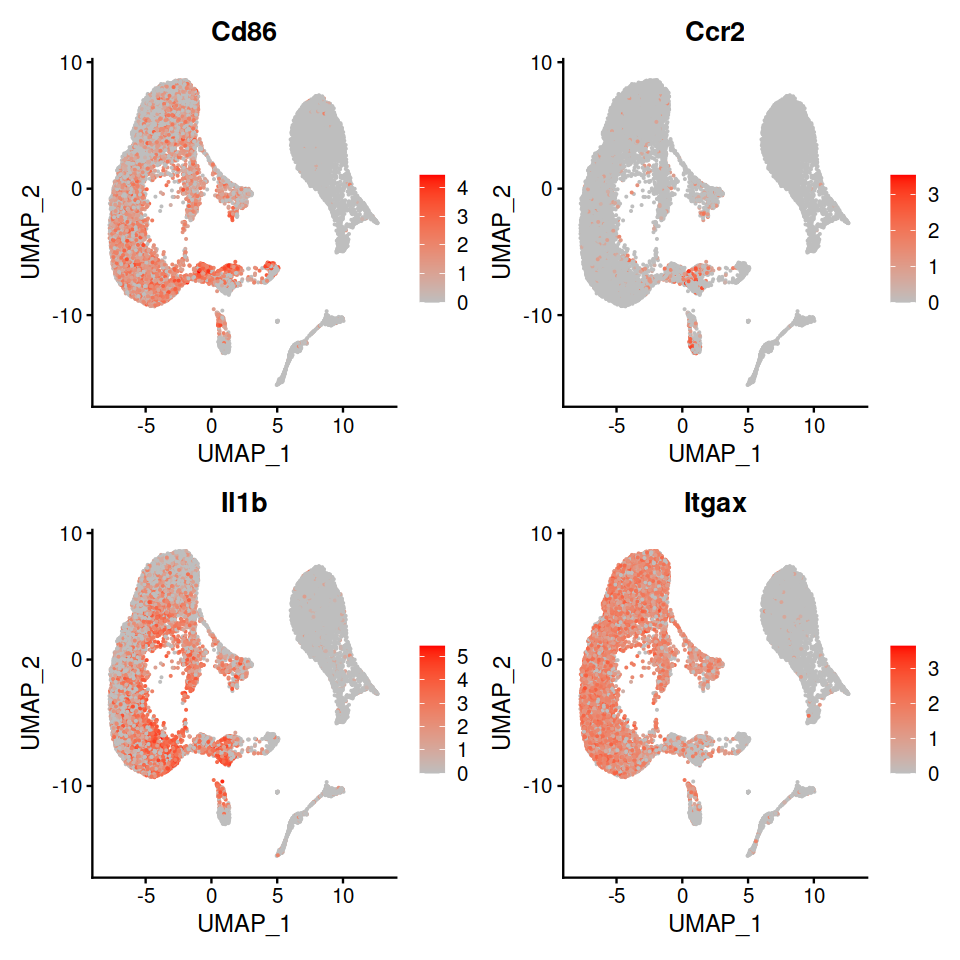

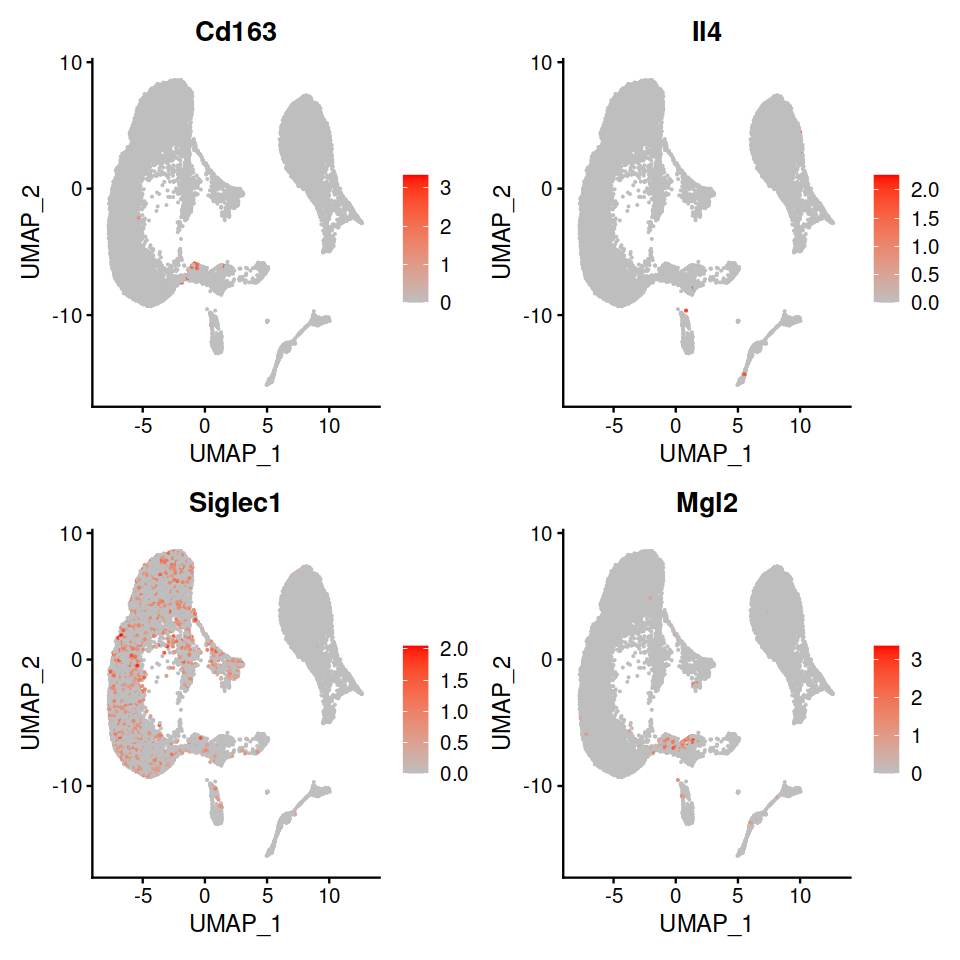

In [70]:
M1 = c('Cd86',
'Ccr2',
'Il1b',
'Itgax')

M2 = c('Cd163',
'Il4',
'Siglec1',
'Mgl2')

FeaturePlot(obj, reduction = "umap", features = M1,  ncol =2, cols = c("grey", "red"))
FeaturePlot(obj, reduction = "umap", features = M2,  ncol =2, cols = c("grey", "red"))

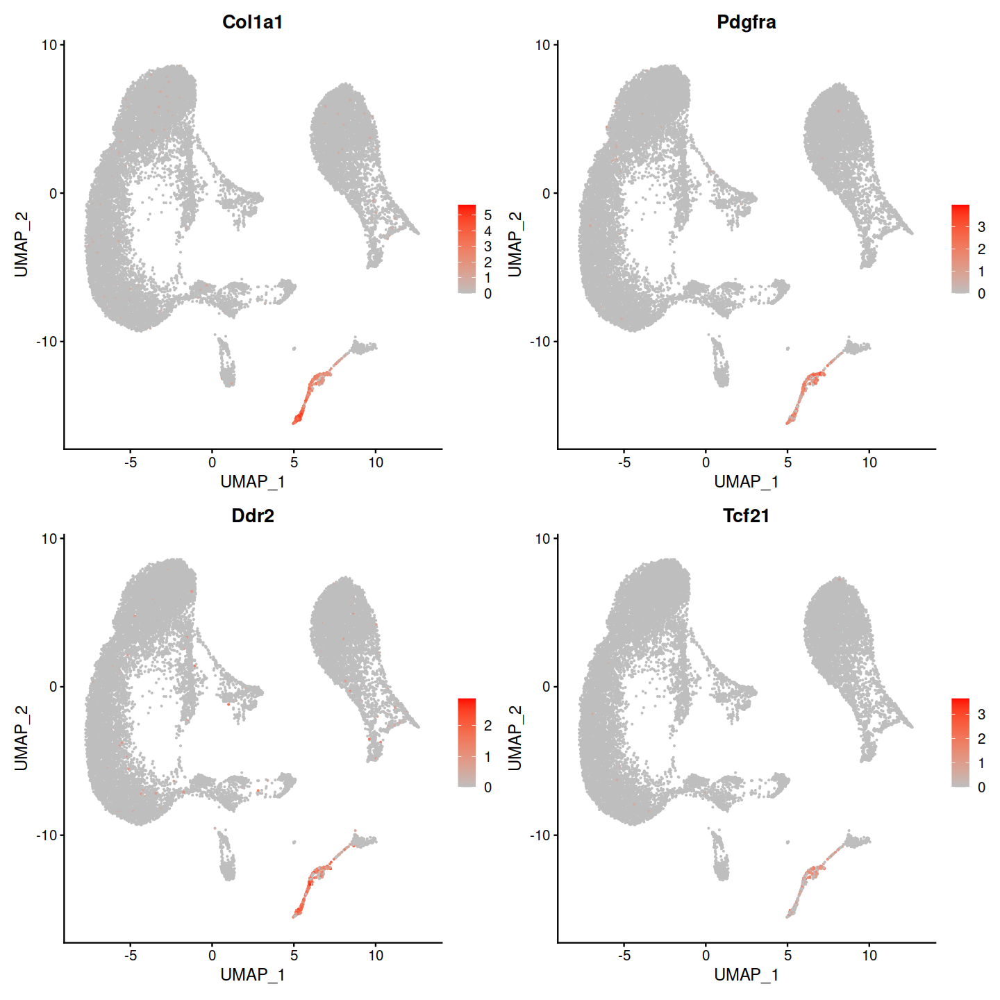

In [35]:
#fibroblast marker
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction = "umap", features = c("Col1a1", "Pdgfra","Ddr2", "Tcf21"),  ncol =2, cols = c("grey", "red"))

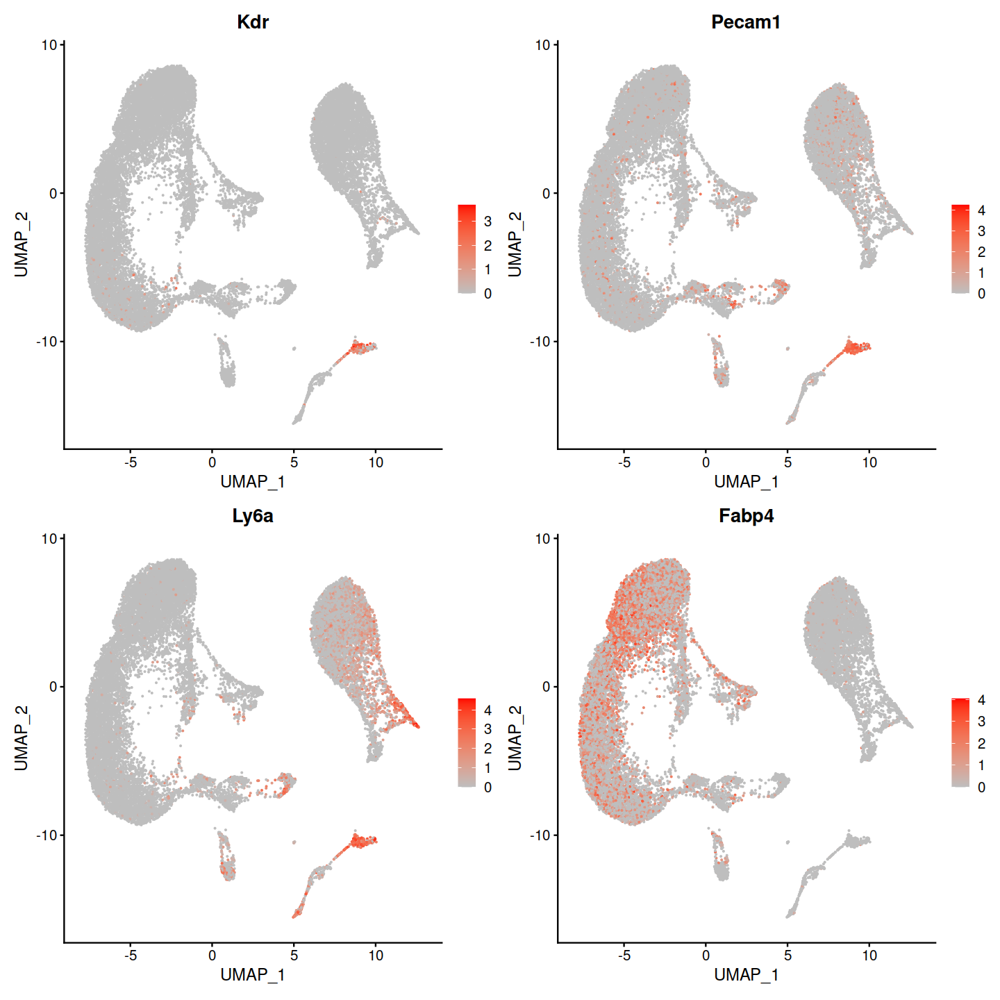

In [36]:
#endothelial marker
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction = "umap", features = c("Kdr", "Pecam1","Ly6a", "Fabp4"),  ncol =2, cols = c("grey", "red"))

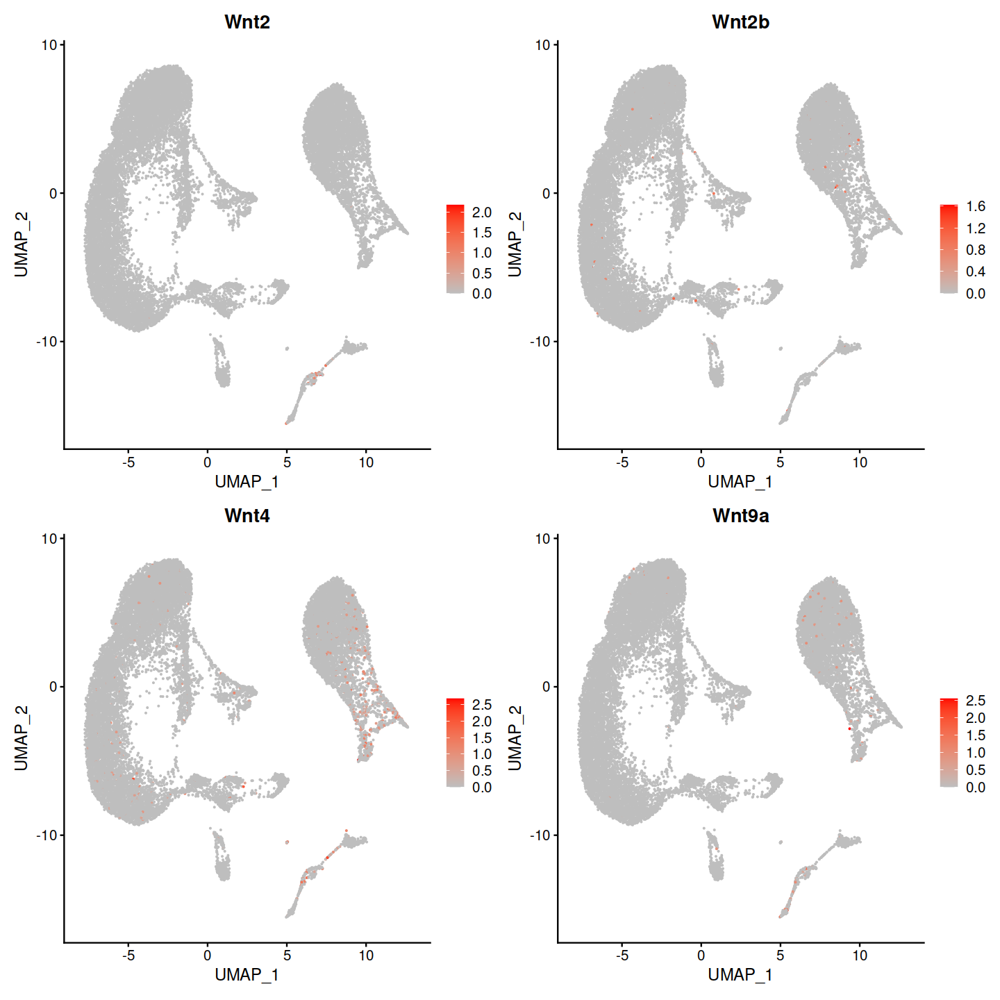

In [37]:
#wnt_gene
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction='umap', features = c("Wnt2", "Wnt2b","Wnt4", "Wnt9a"),  ncol =2, cols = c("grey", "red"))

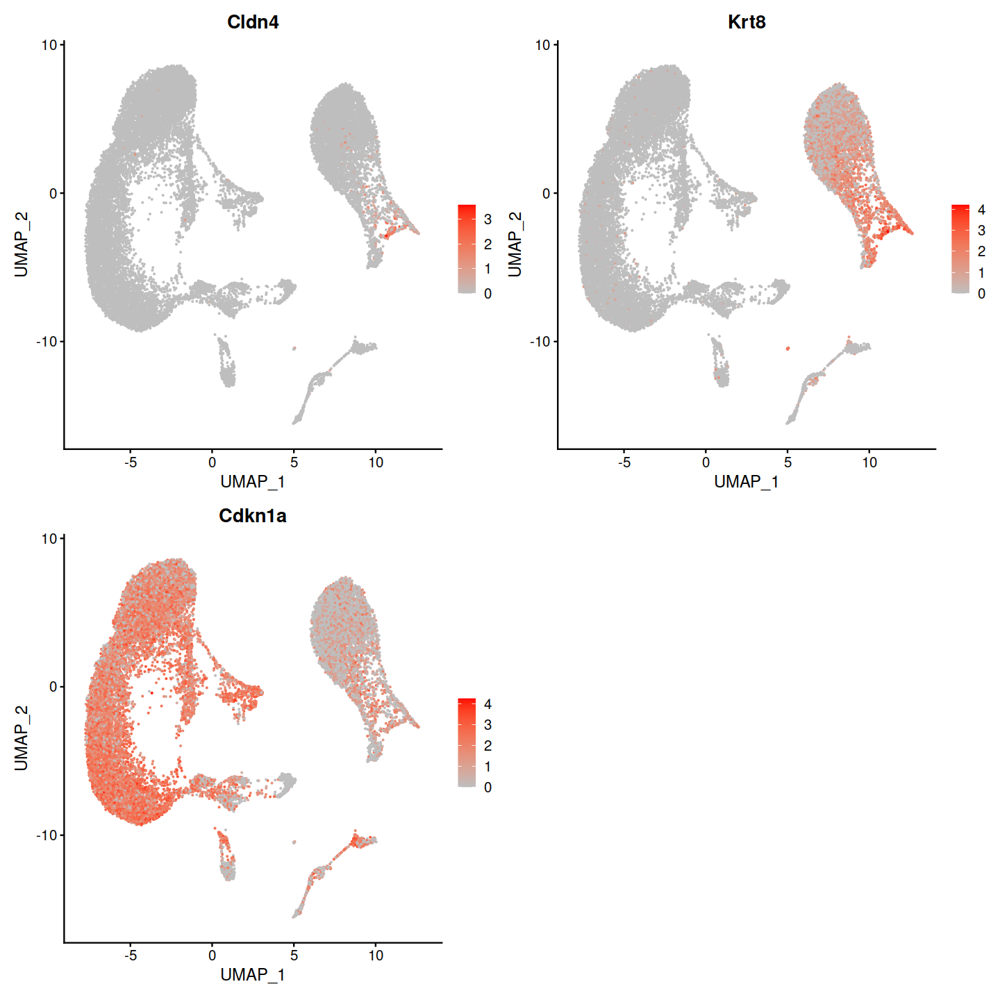

In [39]:
#DATP marker
options(repr.plot.width=12, repr.plot.height=12)
FeaturePlot(obj, reduction='umap', features = c("Cldn4", "Krt8", "Cdkn1a"),  ncol =2, cols = c("grey", "red"))

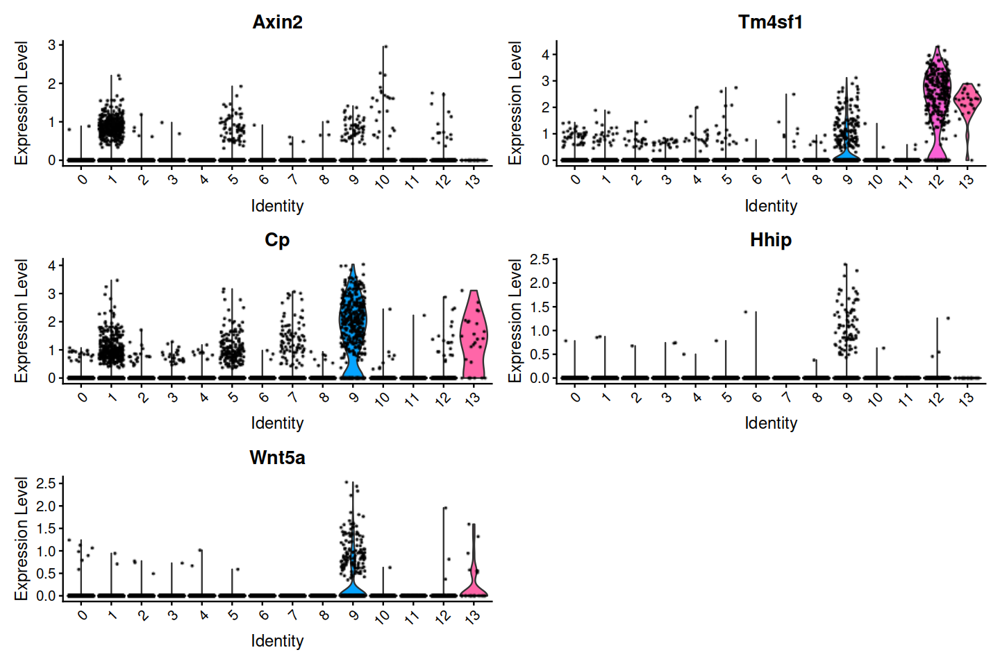

In [47]:
VlnPlot(obj, features = c('Axin2', 'Tm4sf1', 'Cp', 'Hhip', 'Wnt5a'),  ncol =2)

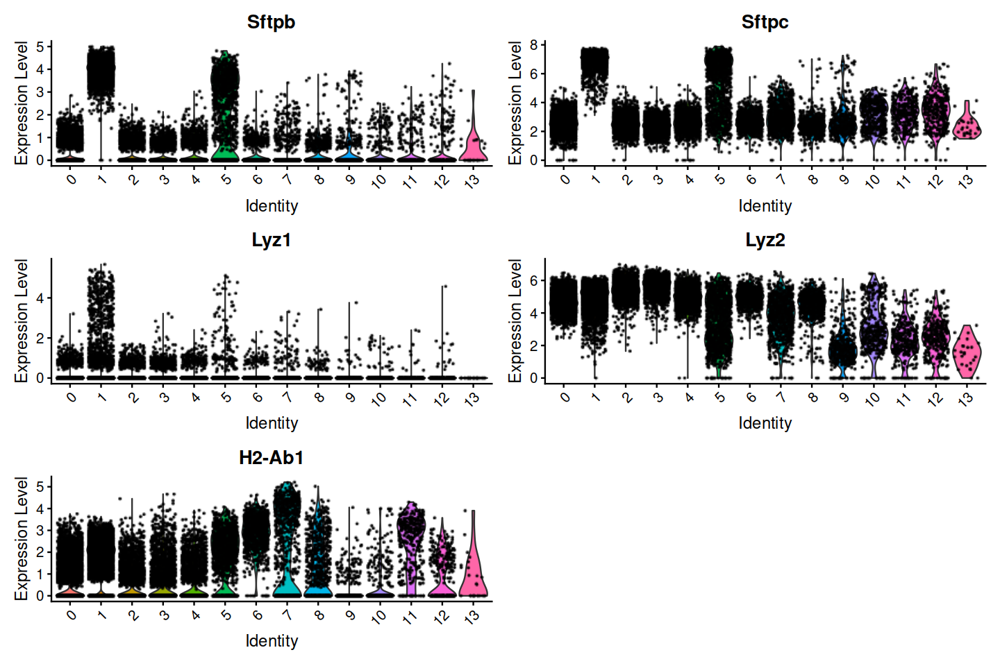

In [48]:
VlnPlot(obj,  features = c('Sftpb', 'Sftpc', 'Lyz1', 'Lyz2', 'H2-Ab1'),  ncol =2)

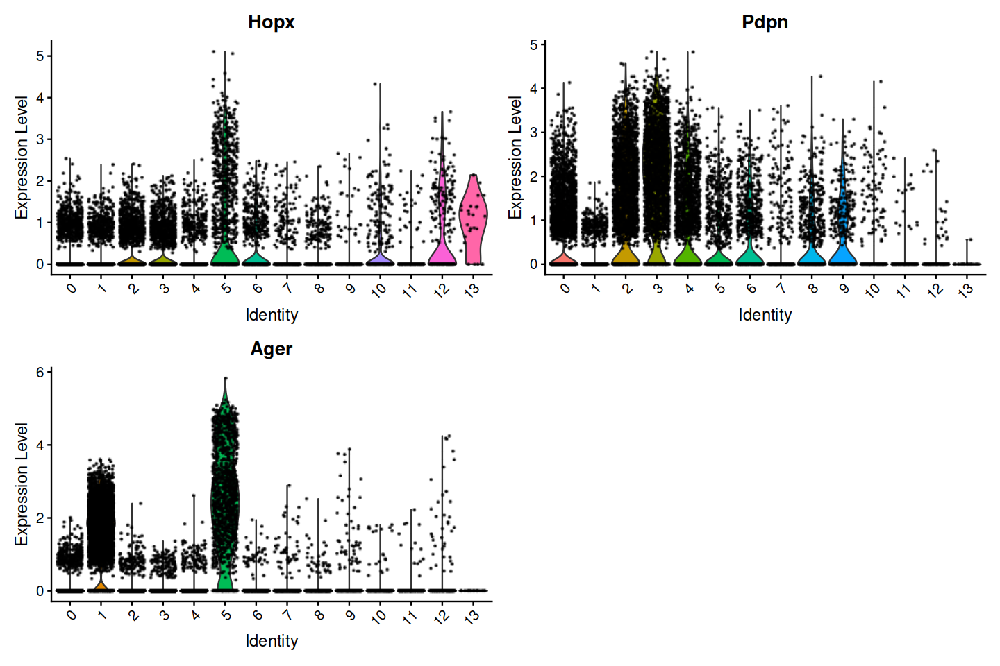

In [49]:
VlnPlot(obj,  features = c('Hopx', 'Pdpn', 'Ager'),  ncol =2)

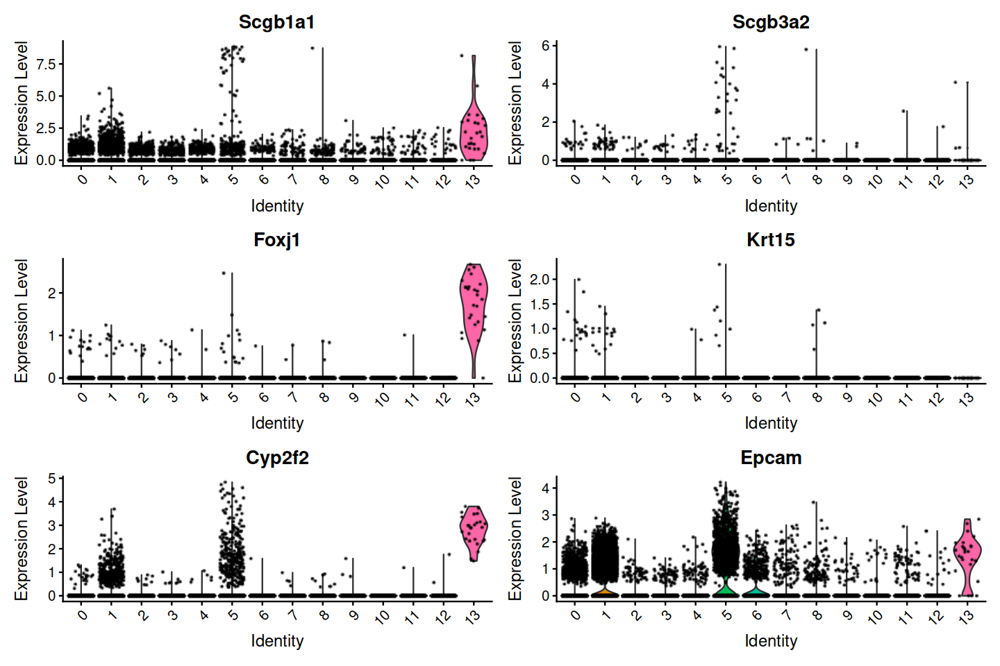

In [50]:
VlnPlot(obj,  features = c('Scgb1a1', 'Scgb3a2', 'Foxj1', "Krt15", "Cyp2f2",'Epcam'),  ncol =2)

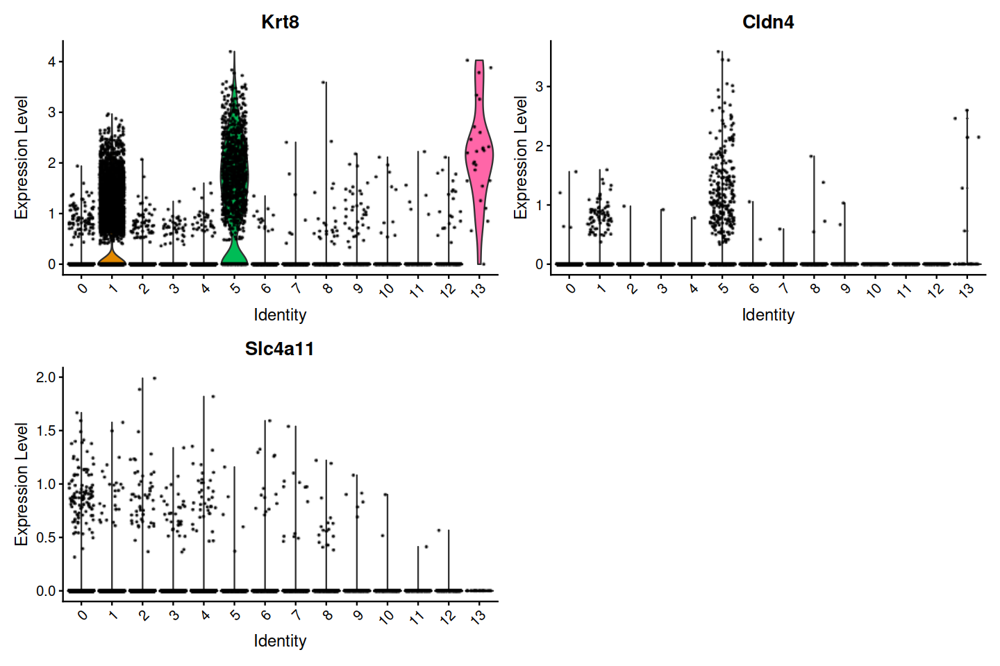

In [51]:
VlnPlot(obj,  features = c('Krt8', 'Cldn4', 'Slc4a11'),  ncol =2)

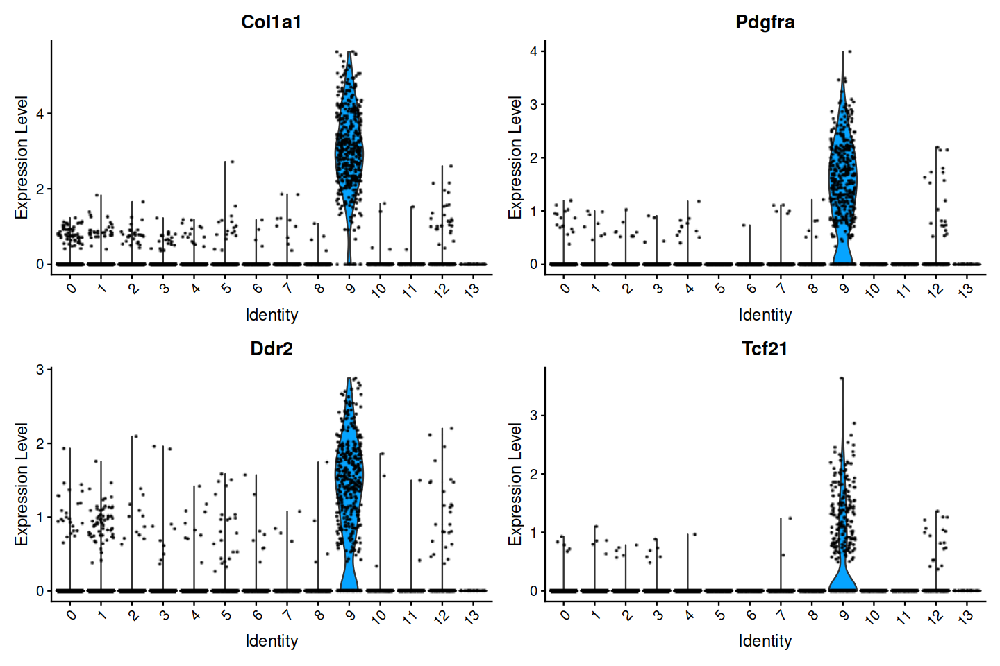

In [52]:
VlnPlot(obj,  features = c("Col1a1", "Pdgfra","Ddr2", "Tcf21"),  ncol =2)

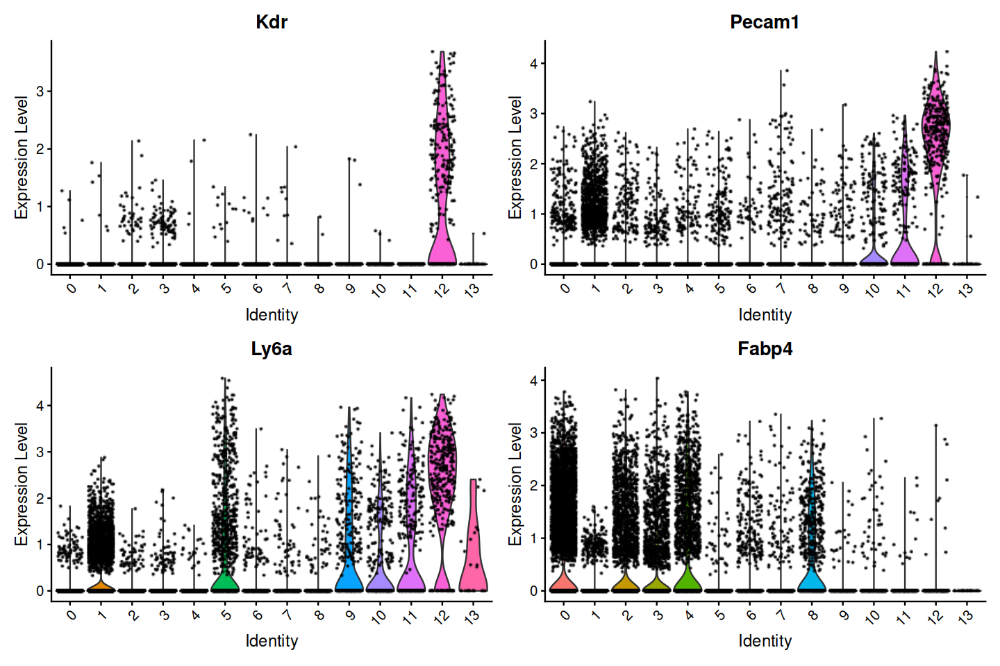

In [53]:
VlnPlot(obj,  features = c("Kdr", "Pecam1","Ly6a", "Fabp4"),  ncol =2)

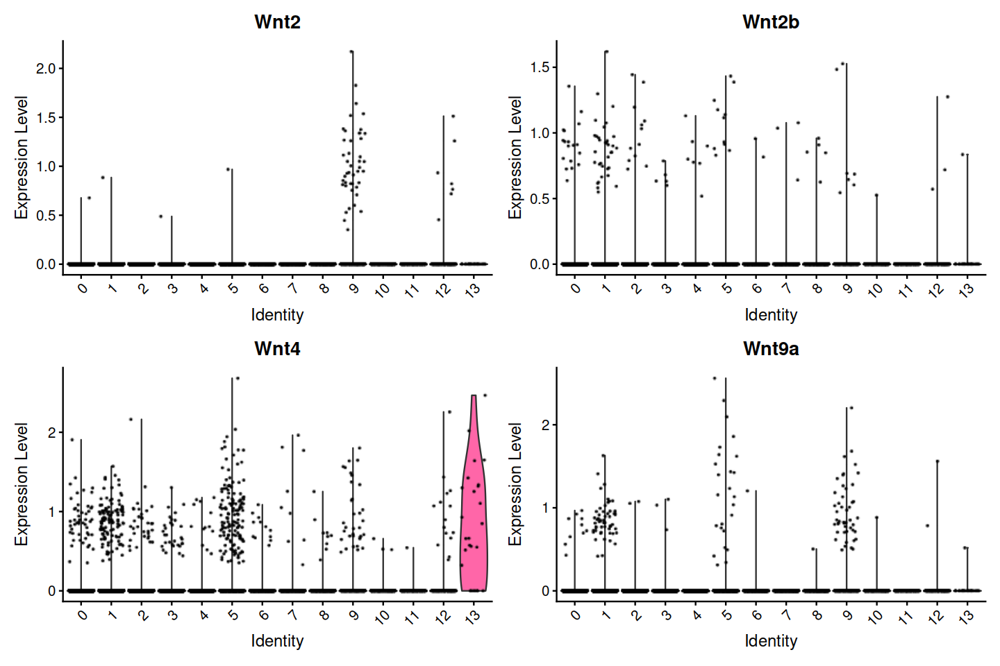

In [54]:
VlnPlot(obj,  features = c("Wnt2", "Wnt2b","Wnt4", "Wnt9a"),  ncol =2)

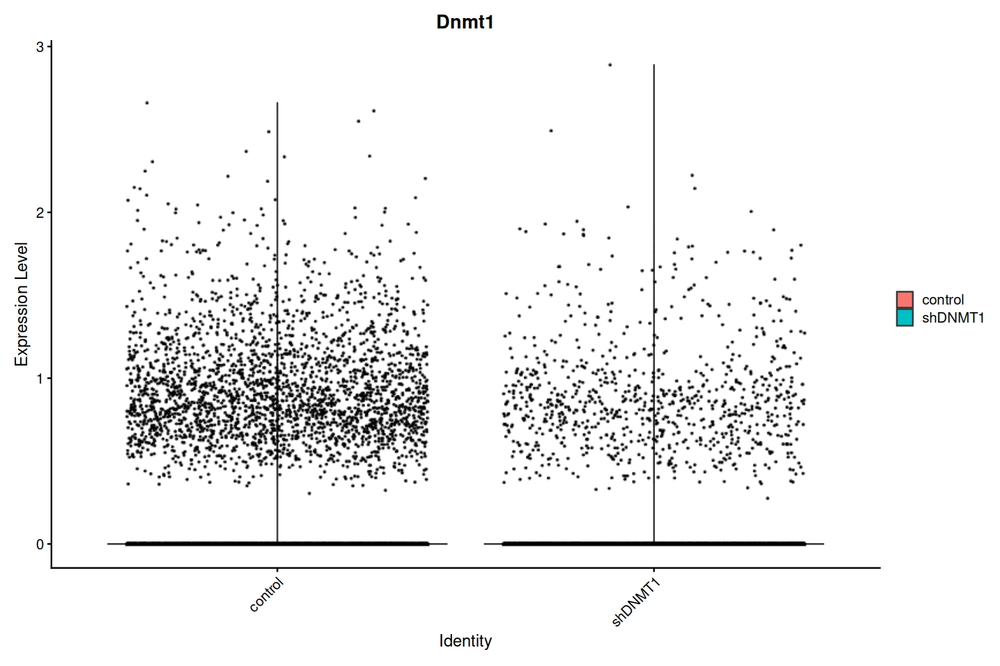

In [55]:
VlnPlot(obj,  features = c("Dnmt1"),  group.by=c('condition'))

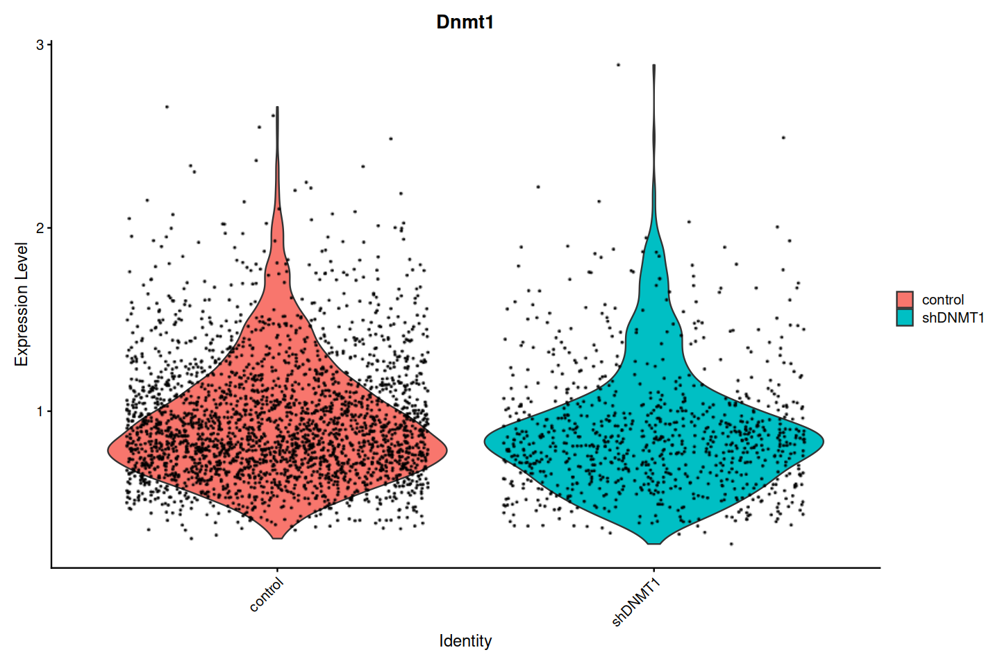

In [56]:
VlnPlot(subset(obj, Dnmt1>0),  features = c("Dnmt1"),  group.by=c('condition'))

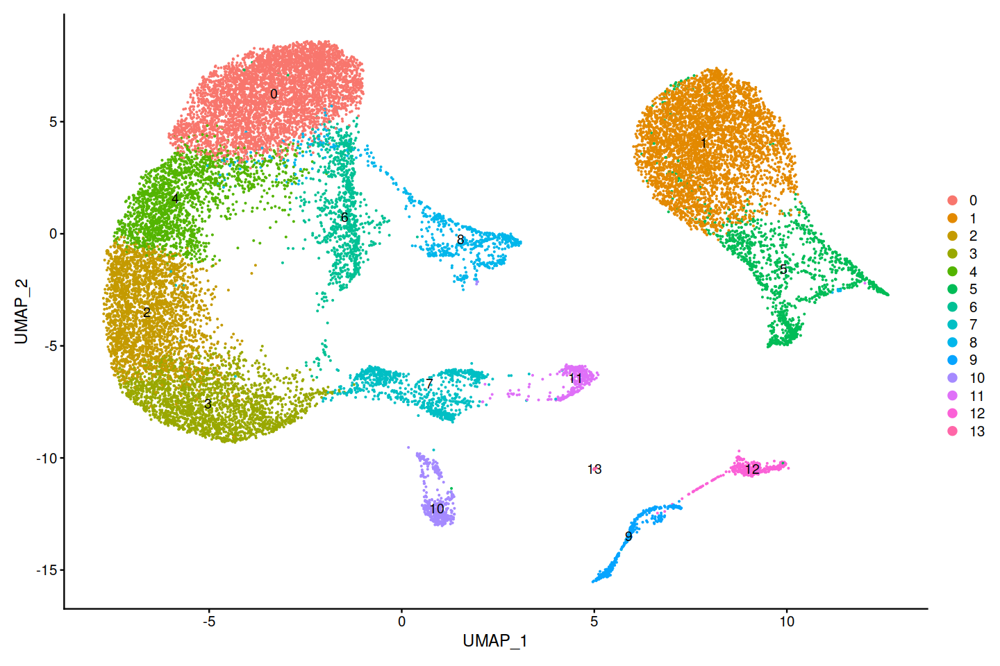

In [57]:
p1

In [63]:
saveRDS(obj, file='/g/data/zk16/qing/tuomas/shDNMT1_scRNA/04combine/shDNMT1_scRNA_merge_defaultlogNorm.rds')

In [1]:
obj=readRDS('/g/data/zk16/qing/tuomas/shDNMT1_scRNA/04combine/shDNMT1_scRNA_merge_defaultlogNorm.rds')

In [6]:
meta=obj[[]]
colnames(meta)

[1] "orig.ident"                 "nCount_RNA"                
 [3] "nFeature_RNA"               "nCount_HTO"                
 [5] "nFeature_HTO"               "hash"                      
 [7] "Submission.date"            "Mouse.ID"                  
 [9] "Hashtag.ID"                 "Hashtag.sequence"          
[11] "shRNA.group"                "Age"                       
[13] "Sex"                        "GFP..Epithelial.cells"     
[15] "GFP..other.cells"           "Cells.for.submission"      
[17] "X10x.submission.ID"         "X10x.sequencing.data.ID"   
[19] "Hashtag.sequencing.data.ID" "Hashtag"                   
[21] "percent.mt"                 "percent.ribo"              
[23] "RNA_snn_res.0.5"            "seurat_clusters"           
[25] "condition"                  "both"

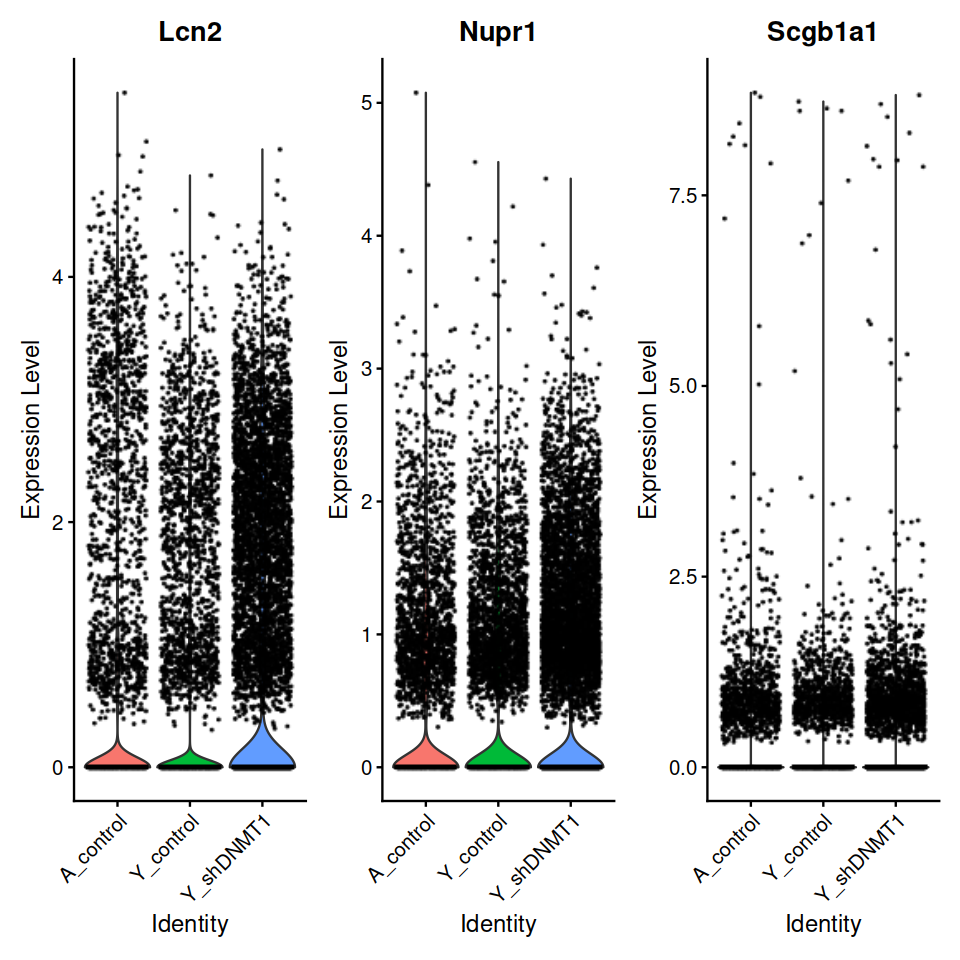

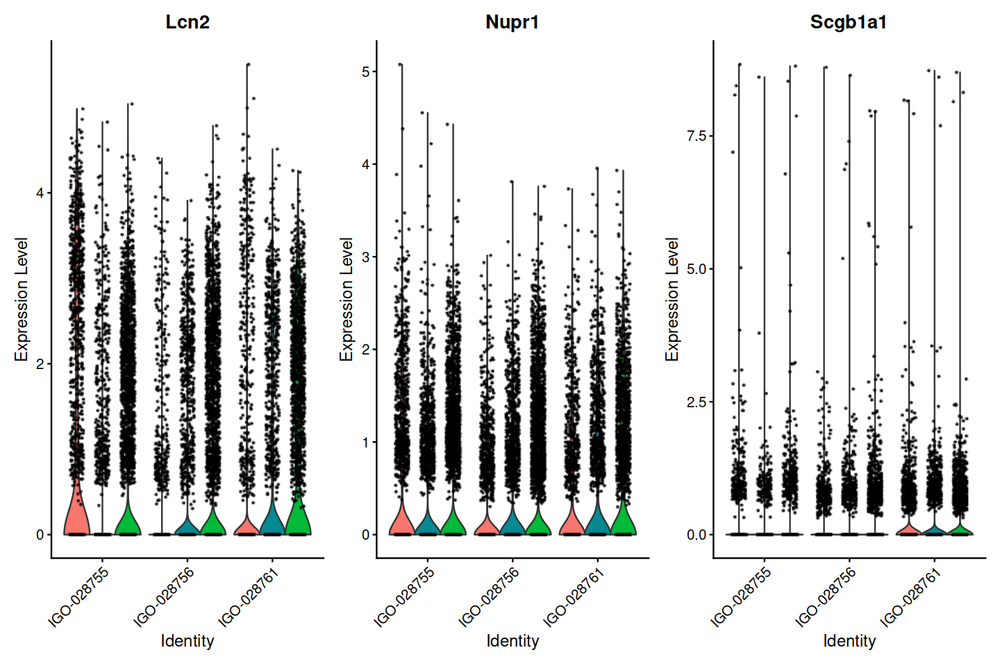

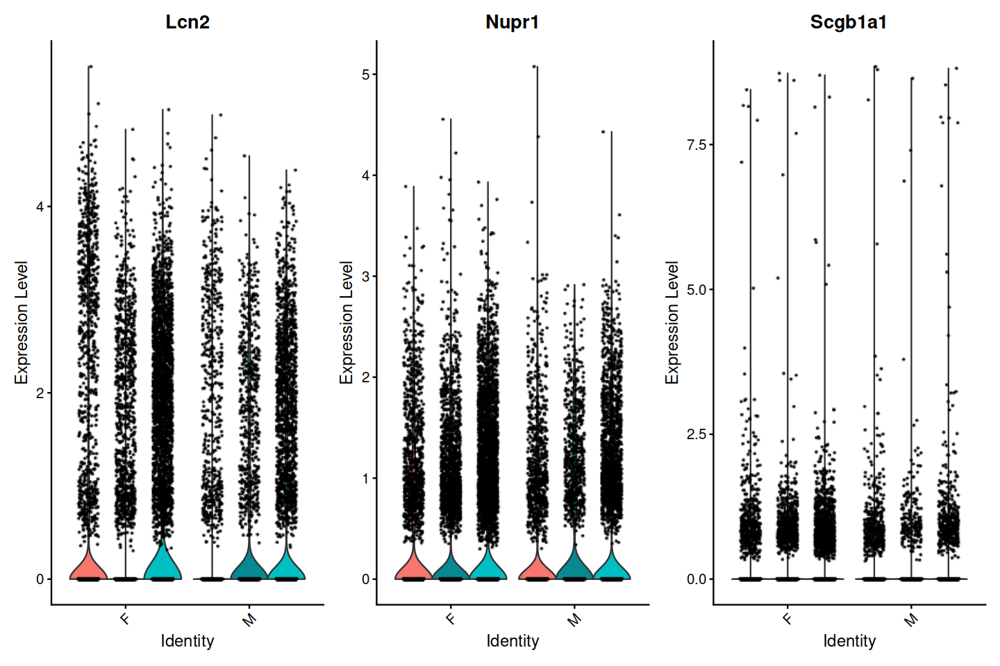

In [17]:
options(repr.plot.width=8, repr.plot.height=8)
VlnPlot(obj,  features = c("Lcn2", "Nupr1", "Scgb1a1"),  group.by=c('both'))

options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(obj ,  features = c("Lcn2", "Nupr1", "Scgb1a1"),  split.by=c('both'), group.by='X10x.submission.ID')


VlnPlot(obj ,  features = c("Lcn2", "Nupr1", "Scgb1a1"),  split.by=c('both'), group.by='Sex')

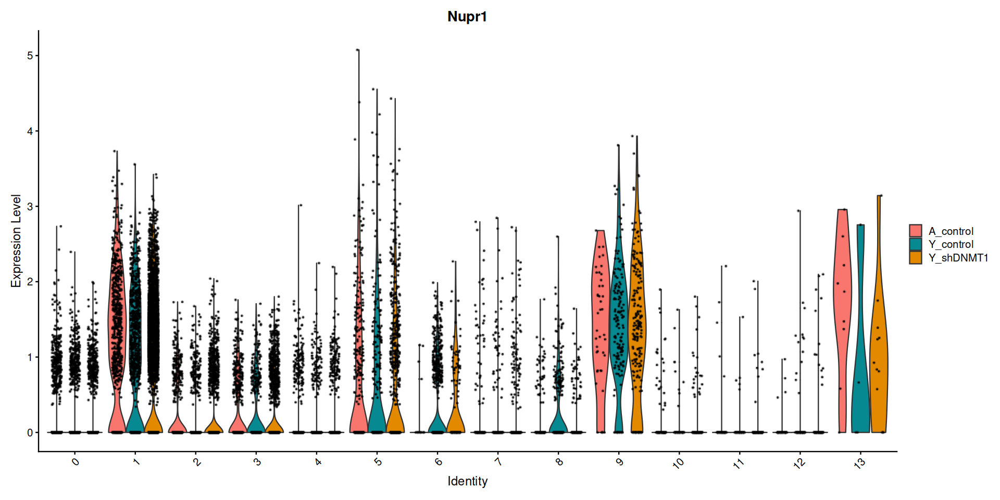

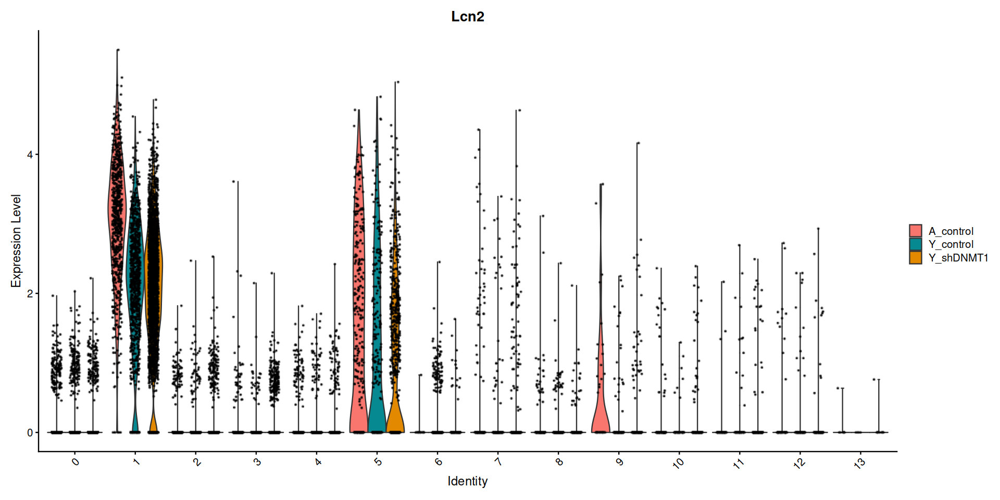

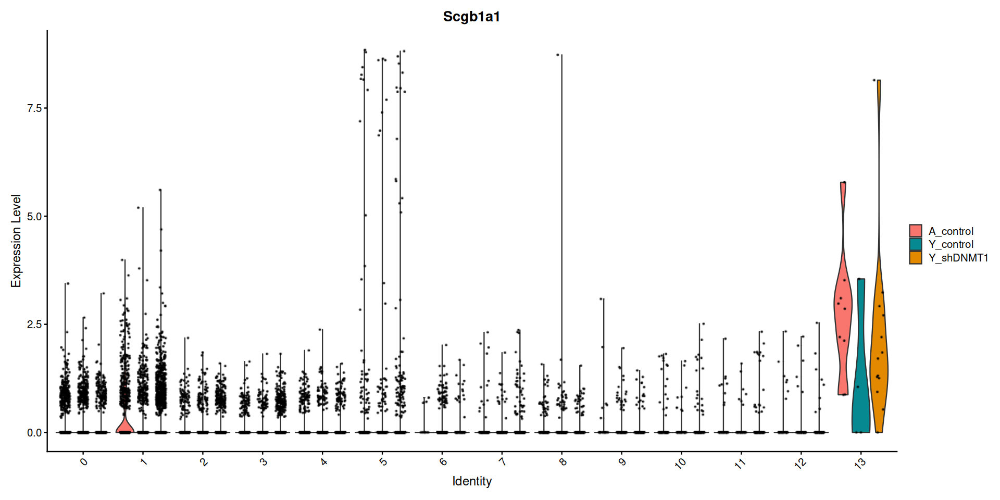

In [15]:
options(repr.plot.width=16, repr.plot.height=8)
VlnPlot(obj ,  features = c("Nupr1"),  split.by=c('both'), group.by='seurat_clusters')
VlnPlot(obj ,  features = c("Lcn2"),  split.by=c('both'), group.by='seurat_clusters')
VlnPlot(obj ,  features = c("Scgb1a1"),  split.by=c('both'), group.by='seurat_clusters')

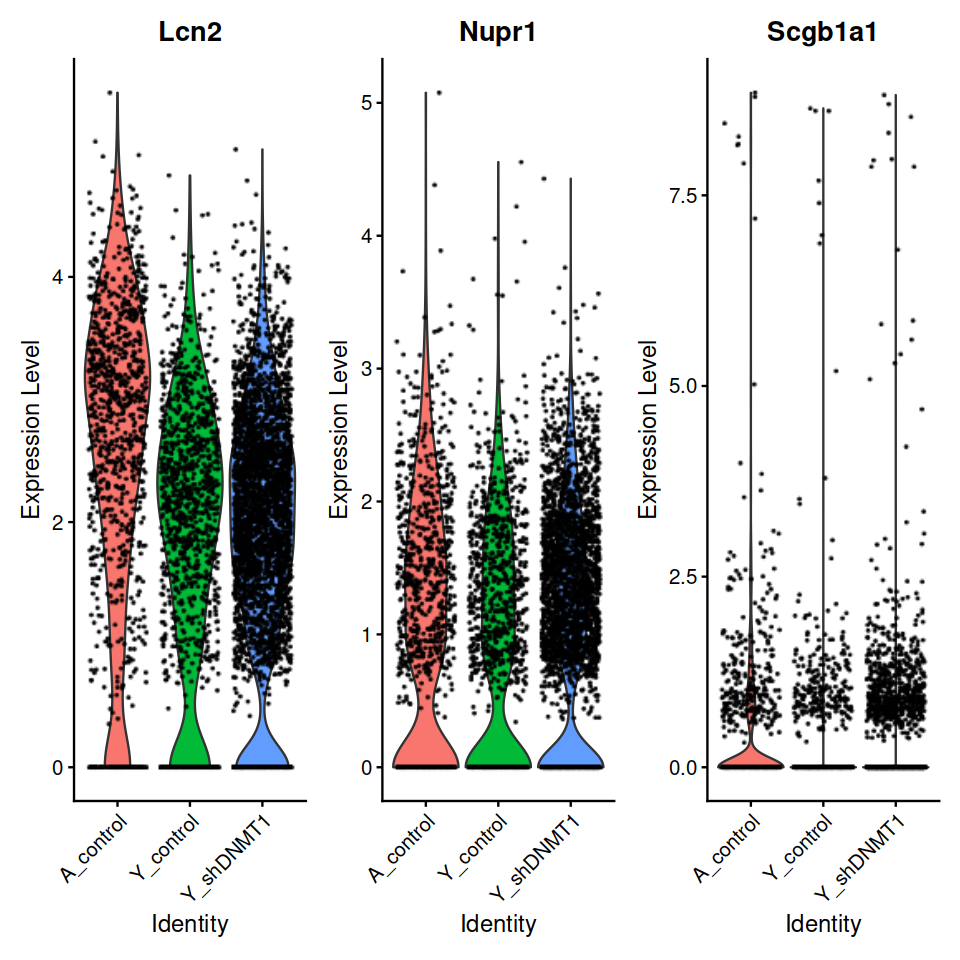

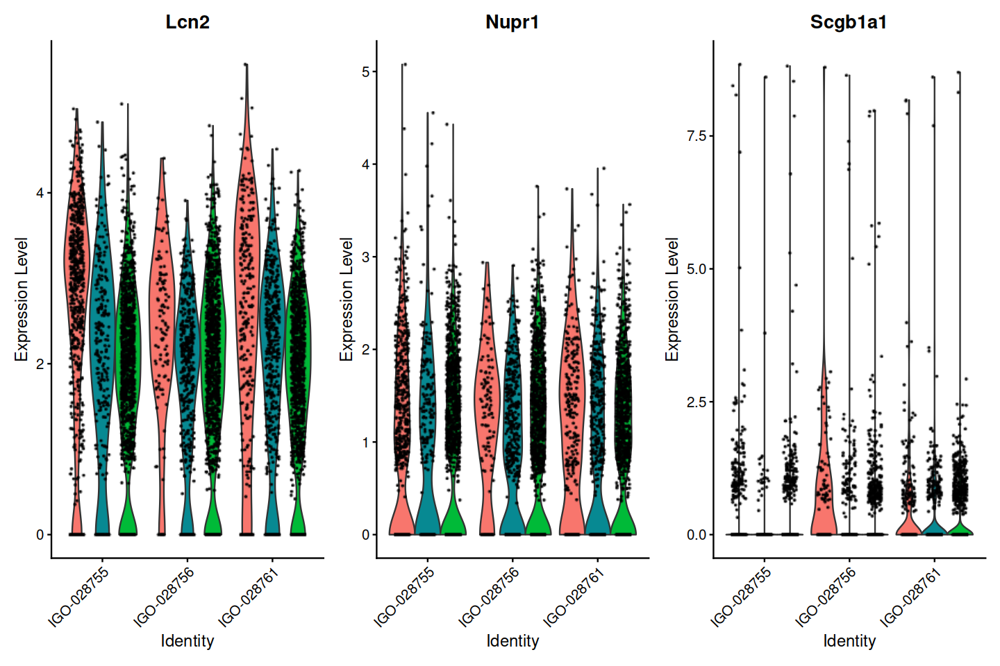

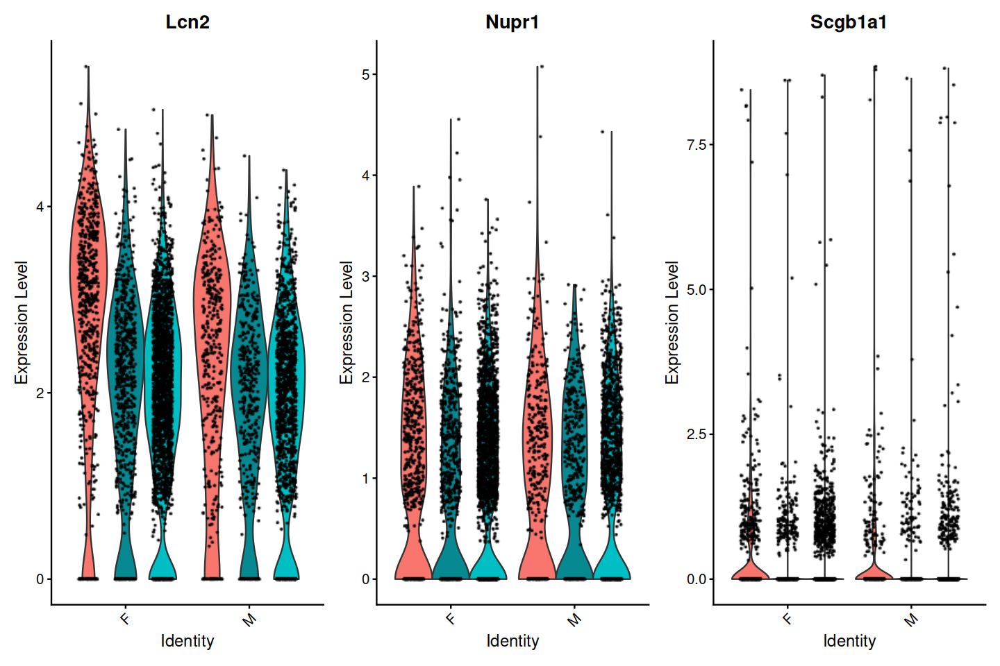

In [16]:
options(repr.plot.width=8, repr.plot.height=8)
VlnPlot(subset(obj , seurat_clusters %in% c(1,5)),  features = c("Lcn2", "Nupr1", "Scgb1a1"),  group.by=c('both'))

options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(subset(obj , seurat_clusters %in% c(1,5)),  features = c("Lcn2", "Nupr1", "Scgb1a1"),  split.by=c('both'), group.by='X10x.submission.ID')
VlnPlot(subset(obj , seurat_clusters %in% c(1,5)),  features = c("Lcn2", "Nupr1", "Scgb1a1"),  split.by=c('both'), group.by='Sex')

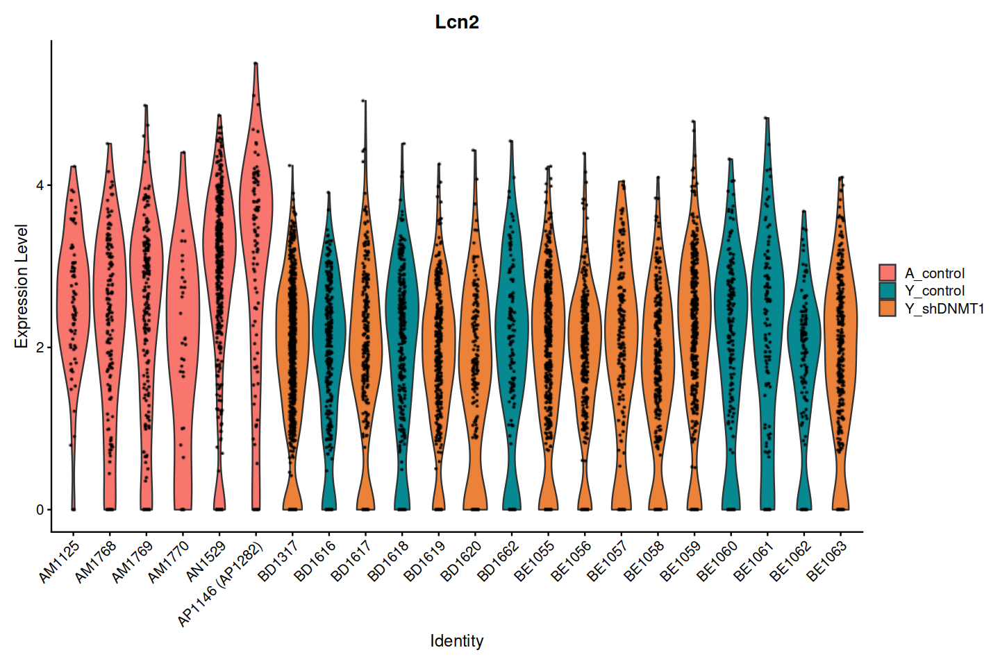

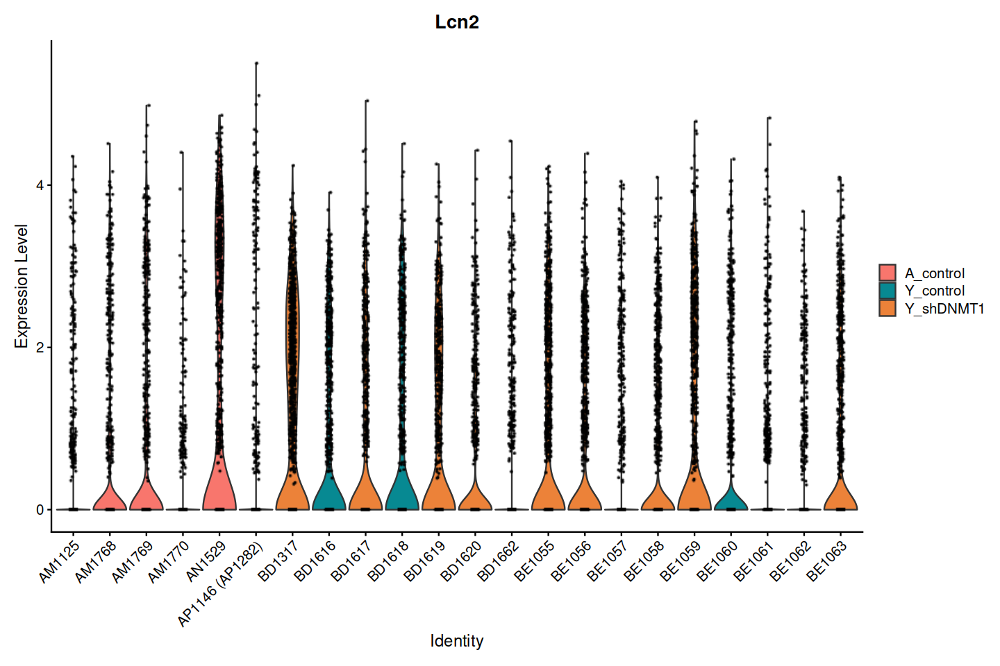

In [5]:
options(repr.plot.width=12, repr.plot.height=8)

VlnPlot(subset(obj , seurat_clusters %in% c(1,5)),  features = c("Lcn2"),  split.by=c('both'), group.by='Mouse.ID')

VlnPlot(obj,  features = c("Lcn2"),  split.by=c('both'), group.by='Mouse.ID')

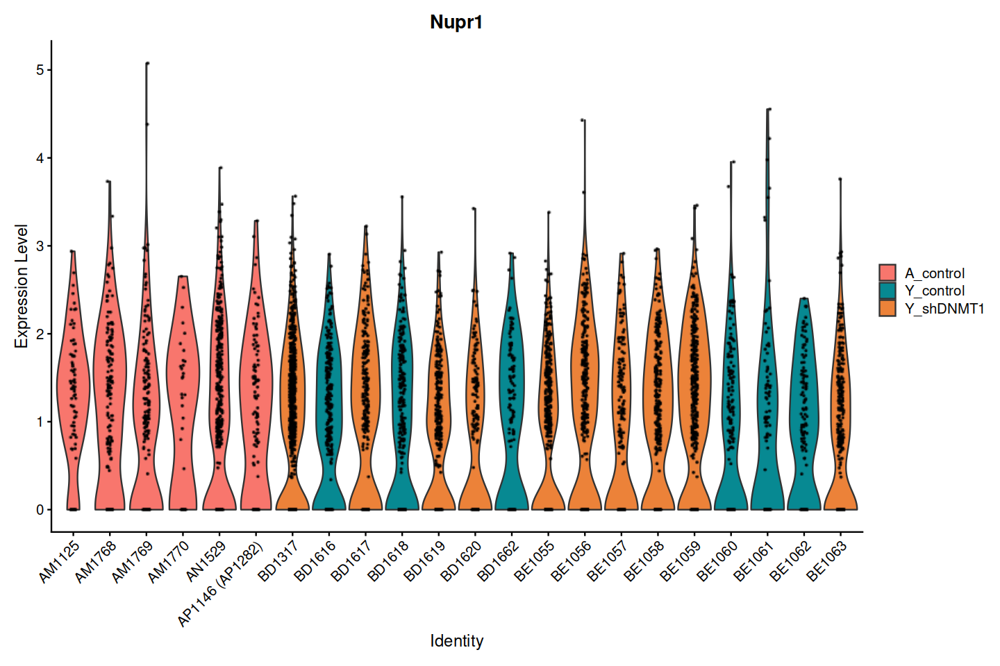

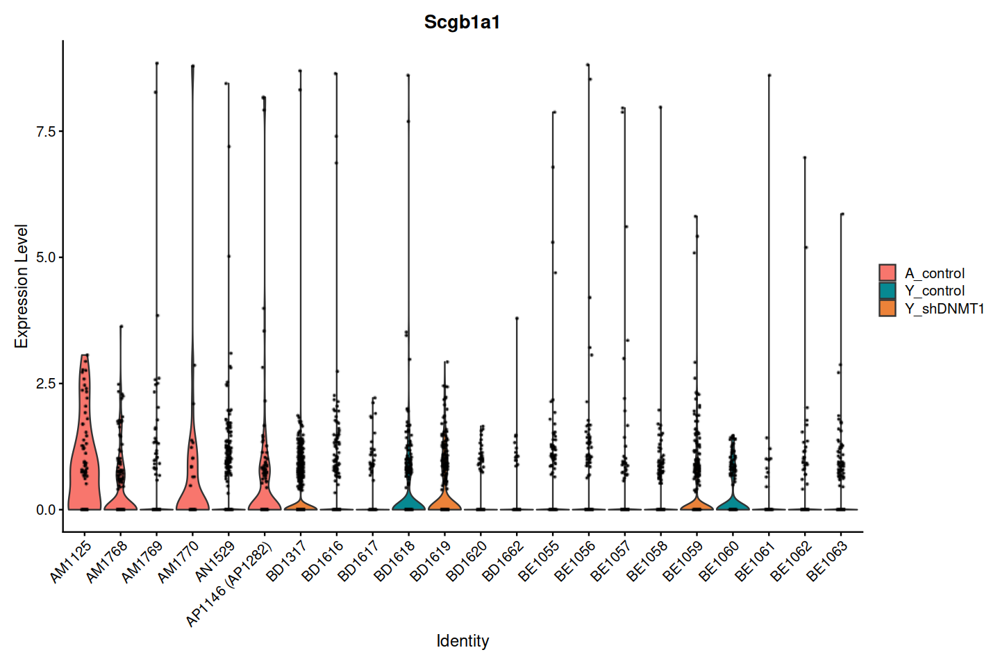

In [6]:
VlnPlot(subset(obj , seurat_clusters %in% c(1,5)),  features = c("Nupr1"),  split.by=c('both'), group.by='Mouse.ID')

VlnPlot(subset(obj , seurat_clusters %in% c(1,5)),  features = c("Scgb1a1"),  split.by=c('both'), group.by='Mouse.ID')

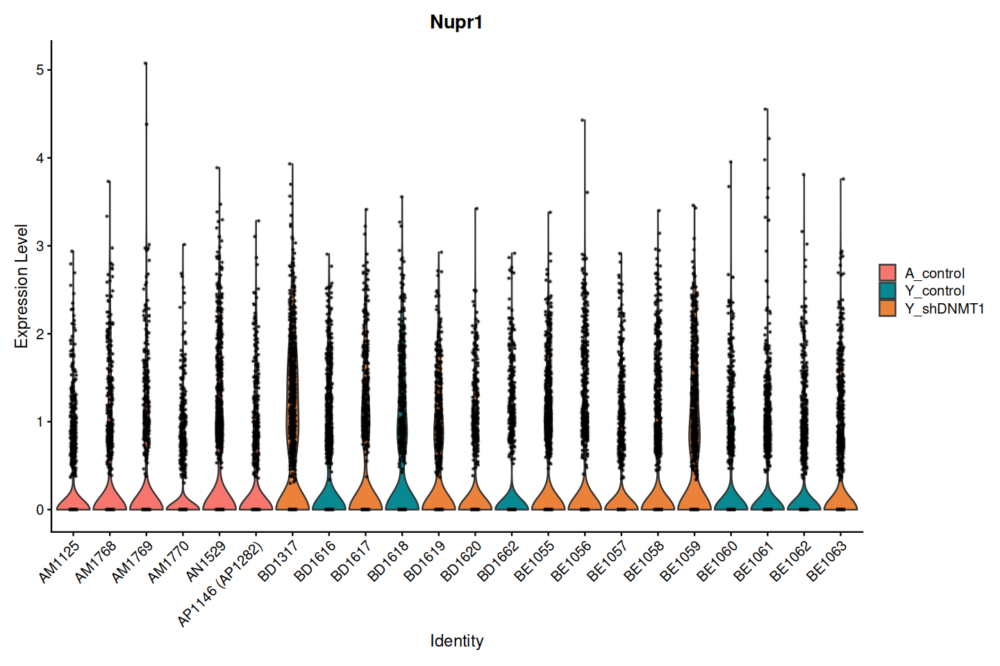

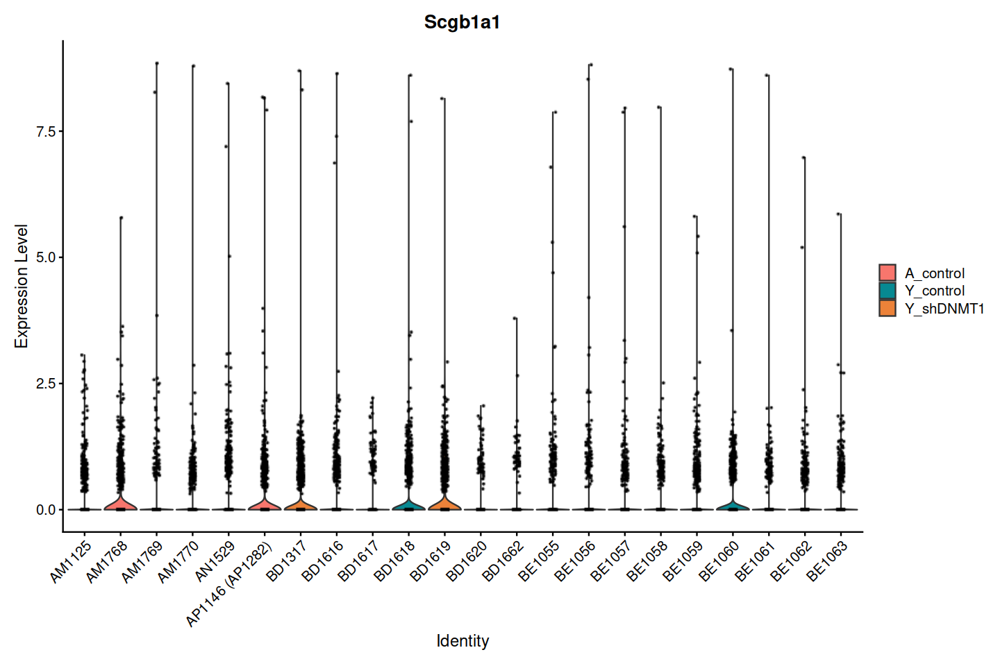

In [7]:
VlnPlot(obj,  features = c("Nupr1"),  split.by=c('both'), group.by='Mouse.ID')

VlnPlot(obj,  features = c("Scgb1a1"),  split.by=c('both'), group.by='Mouse.ID')

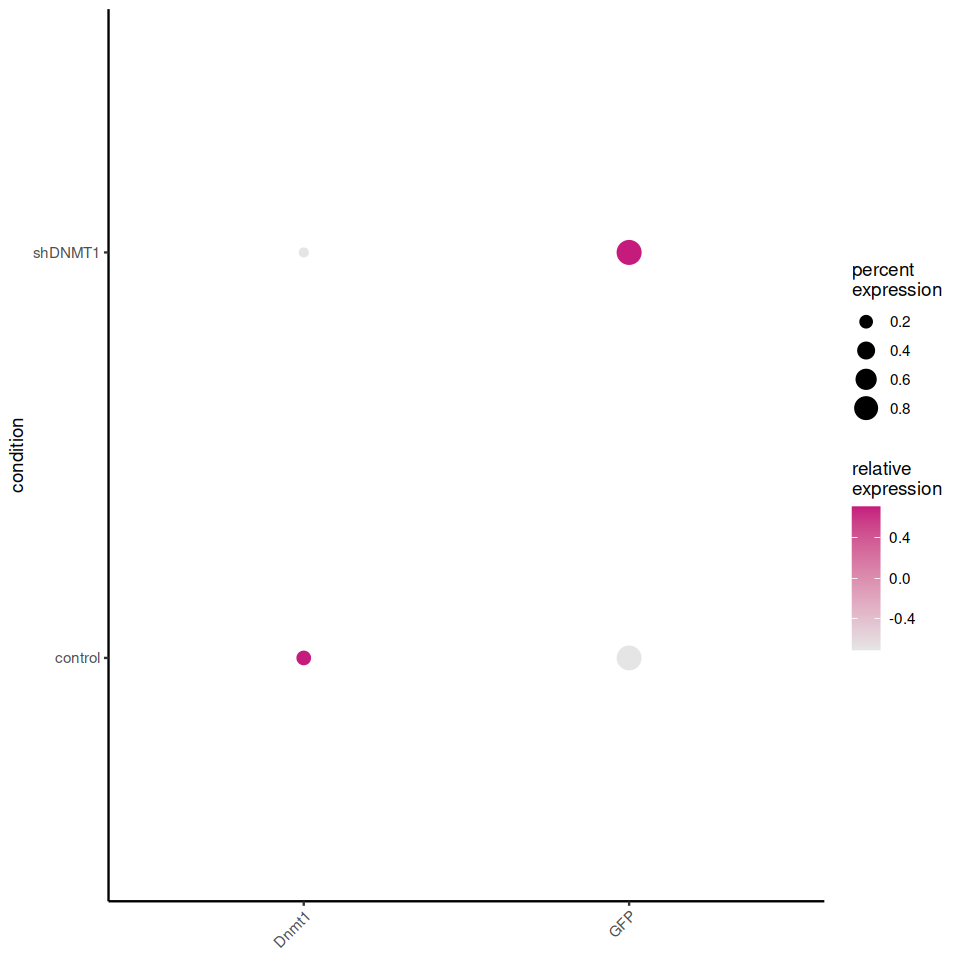

ERROR: Error in FeaturePlot(obj, reduction = "umap", features = c("GFP"), group.by = "condition", : unused argument (group.by = "condition")


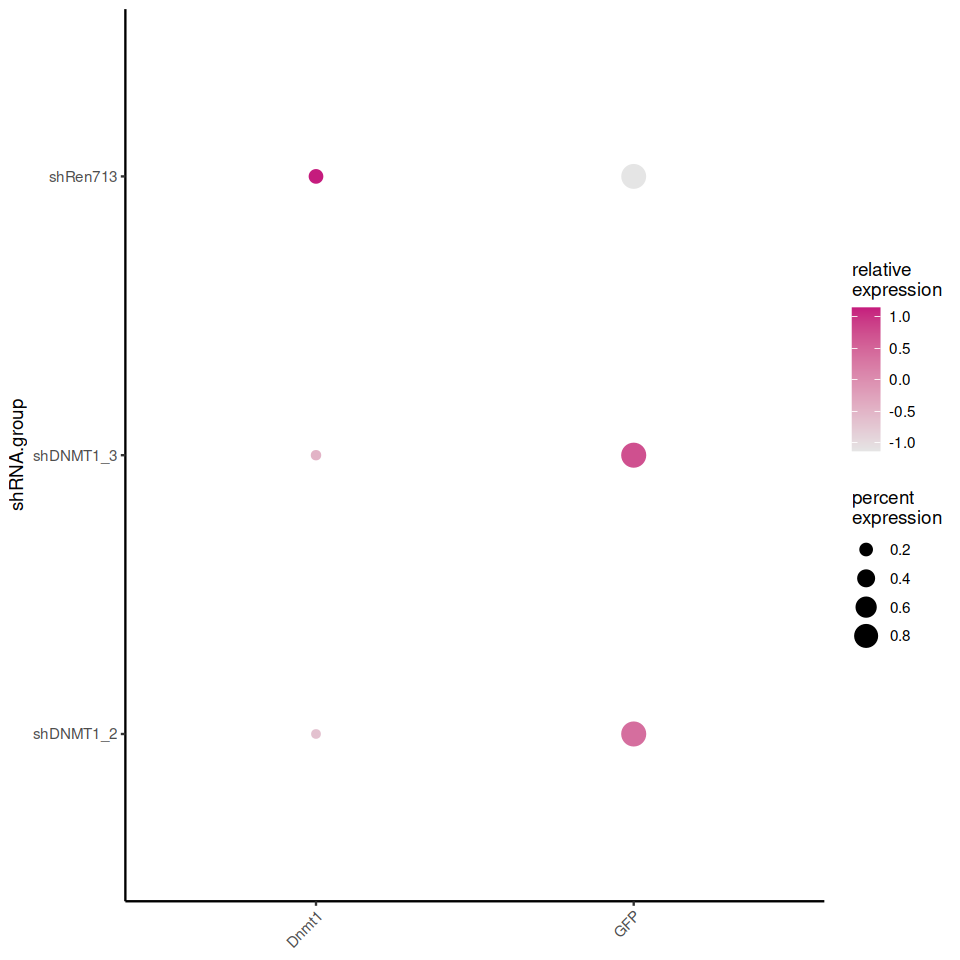

In [68]:
#dot plot for sanity check 
options(repr.plot.width=8, repr.plot.height=8)
library(dittoSeq)
dittoDotPlot(obj, vars = c('Dnmt1','GFP'), group.by = "condition")
dittoDotPlot(obj, vars = c('Dnmt1','GFP'), group.by = "shRNA.group")

#save
pdf('/g/data/zk16/qing/tuomas/shDNMT1_scRNA/04combine/sanity_check_GFP_shDNMT1.pdf')
dittoDotPlot(obj, vars = c('Dnmt1','GFP'), group.by = "condition")
dittoDotPlot(obj, vars = c('Dnmt1','GFP'), group.by = "shRNA.group")
VlnPlot(obj,  features = c("Dnmt1", 'GFP'),  group.by=c('condition'))
VlnPlot(obj,  features = c("Dnmt1", 'GFP'),  group.by=c('shRNA.group'))
FeaturePlot(obj, reduction = "umap", features =c('GFP','Dnmt1', 'tdtomato', 'Cre'))
FeaturePlot(obj, reduction = "umap", features =c('GFP'), group.by='condition', split.by='condition')
FeaturePlot(obj, reduction = "umap", features =c('Dnmt1'), group.by='condition', split.by='condition')
FeaturePlot(obj, reduction = "umap", features =c('GFP'), group.by='condition', split.by='shRNA.group')
FeaturePlot(obj, reduction = "umap", features =c('Dnmt1'), group.by='condition', split.by='shRNA.group')
dev.off()

In [69]:
#feature gene umap
pdf('/g/data/zk16/qing/tuomas/shDNMT1_scRNA/04combine/combine_umap.pdf')
p1
p2
p3
p4
p5
dev.off()


png 
  2

In [1]:
obj=readRDS('/g/data/zk16/qing/tuomas/shDNMT1_scRNA/04combine/shDNMT1_scRNA_merge_defaultlogNorm.rds')

In [61]:
head(obj)

,orig.ident,nCount_RNA,nFeature_RNA,nCount_HTO,nFeature_HTO,hash,Submission.date,Mouse.ID,Hashtag.ID,Hashtag.sequence,...,X10x.submission.ID,X10x.sequencing.data.ID,Hashtag.sequencing.data.ID,Hashtag,percent.mt,percent.ribo,RNA_snn_res.0.5,seurat_clusters,condition,both
,<chr>,<dbl>,<int>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<fct>,<fct>,<chr>,<chr>
IGO_028755_AAACCCAAGACACACG-1,SeuratProject,6873,2509,4676,8,B0306-TotalSeqB,NA,BE1055,HTO-6,TATGCTGCCACGGTA,...,IGO-028755,NA,NA,B0306,2.109705,0.03942965,1,1,shDNMT1,Y_shDNMT1
IGO_028755_AAACCCAAGCGCATCC-1,SeuratProject,9110,3325,9278,8,B0305-TotalSeqB,NA,BD1662,HTO-5,CTTTGTCTTTGTGAG,...,IGO-028755,NA,NA,B0305,1.800220,0.05257958,7,7,control,Y_control
IGO_028755_AAACCCAAGCGCTGAA-1,SeuratProject,5342,2112,307,8,B0307-TotalSeqB,NA,BE1056,HTO-7,GAGTCTGCCAGTATC,...,IGO-028755,NA,NA,B0307,2.976413,0.05409959,1,1,shDNMT1,Y_shDNMT1
IGO_028755_AAACCCAAGCTGGCCT-1,SeuratProject,7166,2765,290,8,B0307-TotalSeqB,NA,BE1056,HTO-7,GAGTCTGCCAGTATC,...,IGO-028755,NA,NA,B0307,1.911806,0.04967904,1,1,shDNMT1,Y_shDNMT1
IGO_028755_AAACCCAAGGAGGTTC-1,SeuratProject,7470,3046,5613,8,B0308-TotalSeqB,NA,BE1061,HTO-8,TATAGAACGCCAGGC,...,IGO-028755,NA,NA,B0308,2.423025,0.06880857,6,6,control,Y_control
IGO_028755_AAACCCACAGACCAGA-1,SeuratProject,6056,2653,13689,8,B0301-TotalSeqB,7/25/2023,AM1769,HTO-1,ACCCACCAGTAAGAC,...,IGO-028755,20230725_shDNMT1_IGO_14863_C_1,20230725_shDNMT1_FB_IGO_14863_D_1,B0301,2.608983,0.03418098,0,0,control,A_control
IGO_028755_AAACCCAGTACGTGAG-1,SeuratProject,9927,2993,12775,8,B0304-TotalSeqB,NA,BD1620,HTO-4,AAAGCATTCTTCACG,...,IGO-028755,NA,NA,B0304,1.783016,0.10275008,3,3,shDNMT1,Y_shDNMT1
IGO_028755_AAACCCAGTGAATGAT-1,SeuratProject,2353,1413,613,8,B0301-TotalSeqB,7/25/2023,AM1769,HTO-1,ACCCACCAGTAAGAC,...,IGO-028755,20230725_shDNMT1_IGO_14863_C_1,20230725_shDNMT1_FB_IGO_14863_D_1,B0301,1.572461,0.03782405,12,12,control,A_control
IGO_028755_AAACCCAGTGGAACAC-1,SeuratProject,6869,2508,1299,8,B0302-TotalSeqB,NA,AN1529,HTO-2,GGTCGAGAGCATTCA,...,IGO-028755,NA,NA,B0302,1.790654,0.08720338,5,5,control,A_control


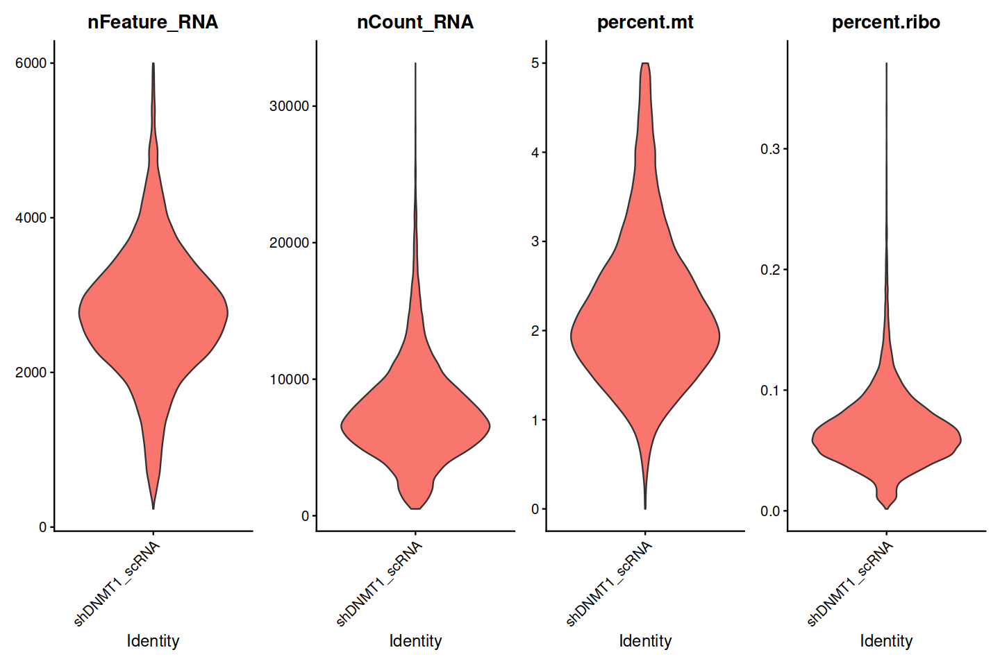

In [62]:

Idents(obj)='shDNMT1_scRNA'

library(ggplot2)
VlnPlot(obj, features = c("nFeature_RNA", "nCount_RNA", "percent.mt", "percent.ribo"), ncol = 4, pt.size=0)

In [58]:
table(obj$X10x.submission.ID)


IGO-028755 IGO-028756 IGO-028761 
      8020       8040       4856 

In [59]:
obj

An object of class Seurat 
32891 features across 20916 samples within 1 assay 
Active assay: RNA (32891 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

In [60]:
sessionInfo()

R version 4.0.0 (2020-04-24)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Rocky Linux 8.8 (Green Obsidian)

Matrix products: default
BLAS/LAPACK: /apps/intel/compilers_and_libraries_2019.5.281/linux/mkl/lib/intel64_lin/libmkl_intel_lp64.so

locale:
 [1] LC_CTYPE=C.UTF-8    LC_NUMERIC=C        LC_TIME=C          
 [4] LC_COLLATE=C        LC_MONETARY=C       LC_MESSAGES=C      
 [7] LC_PAPER=C          LC_NAME=C           LC_ADDRESS=C       
[10] LC_TELEPHONE=C      LC_MEASUREMENT=C    LC_IDENTIFICATION=C

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] ggplot2_3.3.3      SeuratObject_4.0.4 Seurat_4.1.0      

loaded via a namespace (and not attached):
  [1] Rtsne_0.15            ggbeeswarm_0.6.0      colorspace_2.0-0     
  [4] deldir_1.0-6          ggridges_0.5.3        IRdisplay_1.1        
  [7] base64enc_0.1-3       spatstat.data_3.0-0   leiden_0.3.7         
 [10] listenv_0.8.0         farver_2

In [ ]:
#9. find marker genes for each cluster
obj.markers <- FindAllMarkers(obj, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)
library(dplyr)
obj.markers %>%
    group_by(cluster) %>%
    slice_max(n = 5, order_by = avg_log2FC)


Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6



In [ ]:
#save csv
write.csv(obj.markers, file='/g/data/zk16/qing/tuomas/scRNA_aging_exercise/feb2021/DEGv3/cluster_marker.csv')

In [ ]:
obj.markers %>%
    group_by(cluster) %>%
    top_n(n = 10, wt = avg_log2FC) -> top10


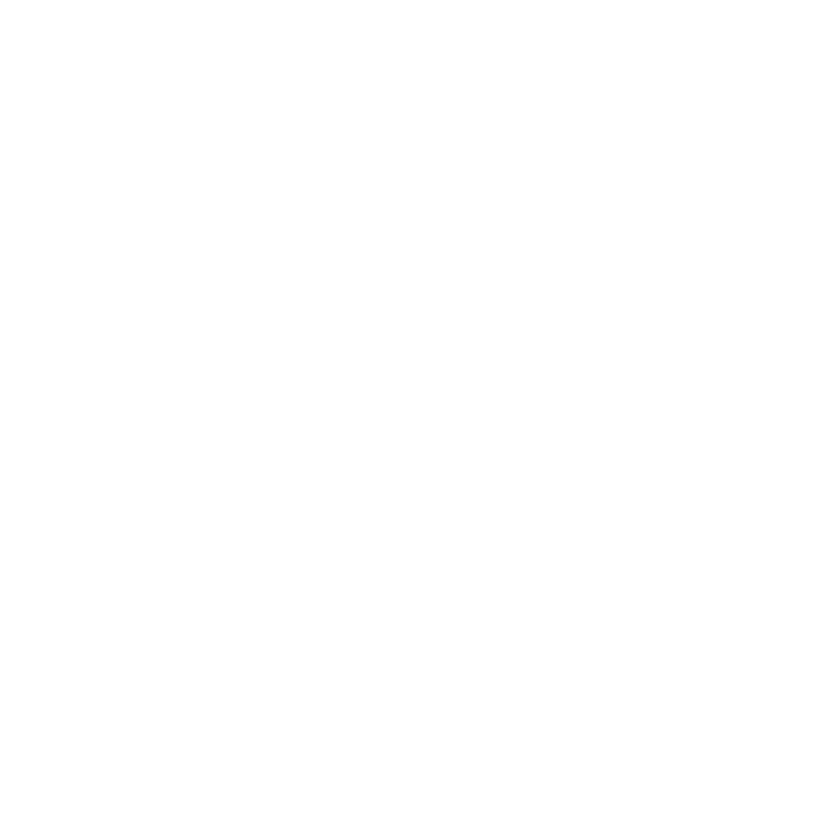

In [48]:
DoHeatmap(obj, features = top10$gene) + NoLegend()

In [2]:
obj

An object of class Seurat 
32891 features across 20916 samples within 1 assay 
Active assay: RNA (32891 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

In [7]:
#add significance level to the difference of DNMT1 in shDNMT1 and control group
Idents(obj)='condition'
FindAllMarkers(obj, min.pct = 0.25, logfc.threshold = 0.25) #only.pos = TRUE, 


Calculating cluster shDNMT1

Calculating cluster control



,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Car4,8.134305e-276,-0.9550940,0.154,0.358,2.675454e-271,shDNMT1,Car4
Kcnip4,2.386483e-230,-0.9727138,0.261,0.473,7.849382e-226,shDNMT1,Kcnip4
Wfdc21,2.083419e-218,-0.6956940,0.324,0.527,6.852573e-214,shDNMT1,Wfdc21
Ms4a8a,4.465453e-207,-0.5215942,0.239,0.429,1.468732e-202,shDNMT1,Ms4a8a
Cybb,4.282105e-204,-0.6535847,0.623,0.752,1.408427e-199,shDNMT1,Cybb
Chil3,5.968384e-188,-0.8922392,0.776,0.855,1.963061e-183,shDNMT1,Chil3
Ly75,1.133919e-183,-0.6060037,0.361,0.537,3.729573e-179,shDNMT1,Ly75
Pde7b,2.038863e-175,0.5799960,0.538,0.355,6.706023e-171,shDNMT1,Pde7b
Pparg,2.252392e-175,-0.6545634,0.409,0.582,7.408343e-171,shDNMT1,Pparg


In [13]:
de= FindAllMarkers(obj, min.pct = 0.1, logfc.threshold = 0.1,only.pos = TRUE ) #only.pos = TRUE, 

Calculating cluster shDNMT1

Calculating cluster control



In [14]:
de['Dnmt1',]
de[which(de$cluster == 'control'),]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Dnmt1,2.169679e-197,0.3138376,0.241,0.088,7.136291e-193,control,Dnmt1


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Car4,8.134305e-276,0.9550940,0.358,0.154,2.675454e-271,control,Car4
Kcnip4,2.386483e-230,0.9727138,0.473,0.261,7.849382e-226,control,Kcnip4
Wfdc21,2.083419e-218,0.6956940,0.527,0.324,6.852573e-214,control,Wfdc21
Ms4a8a,4.465453e-207,0.5215942,0.429,0.239,1.468732e-202,control,Ms4a8a
Cybb,4.282105e-204,0.6535847,0.752,0.623,1.408427e-199,control,Cybb
Dnmt1,2.169679e-197,0.3138376,0.241,0.088,7.136291e-193,control,Dnmt1
9530059O14Rik,8.180162e-193,0.6928431,0.134,0.023,2.690537e-188,control,9530059O14Rik
Chil3,5.968384e-188,0.8922392,0.855,0.776,1.963061e-183,control,Chil3
Ly75,1.133919e-183,0.6060037,0.537,0.361,3.729573e-179,control,Ly75


In [15]:
cnt= GetAssayData(object = obj, assay = "RNA", slot = "data")

wilcox.test(cnt['Dnmt1',which(obj$condition == 'shDNMT1')], cnt['Dnmt1',which(obj$condition == 'control')])



	Wilcoxon rank sum test with continuity correction

data:  cnt["Dnmt1", which(obj$condition == "shDNMT1")] and cnt["Dnmt1", which(obj$condition == "control")]
W = 46095354, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0
